## Monte Carlo Algorithm to recommend songs by approximating the state using and action space using clustering

In this notebook, we generated the used the autoencoder for state and action space to generate the latent vector representation of both of these entities. Then used the clustered labelled data of both of these with **1000 clusters for state and 100 clusters for song track.**

#### Importing necessary libraries for this notebook

In [1]:
import glob
import pandas as pd
import numpy as np
from tqdm import tqdm
import pickle
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.layers import Input, Dense
from keras.models import Model
import matplotlib.pyplot as plt
import random
import math
from numpy import zeros, newaxis
from statistics import mean 
%matplotlib inline

Using TensorFlow backend.


Extracting the latent representation of each track stored in latent_tack_features.csv

In [2]:
latent_track_features_df = pd.read_csv("latent_track_features.csv");
latent_track_features_df.head()

,track_id,0,1,2,3,4,5,6,7
0,t_f9b9a072-8dae-4816-bfd6-d91fc75a5744,0.085536,0.023943,0.125375,-0.145933,0.449010,-0.106019,-0.190885,0.282416
1,t_7f435320-5d3b-497d-9346-0c97429af2b9,0.152102,-0.118725,-0.168167,0.291125,0.540807,0.042686,-0.288468,0.130090
2,t_949441c4-4920-4eed-b929-2d67d37b7bd9,0.056647,-0.077121,0.052887,-0.076303,0.644329,-0.148826,-0.292301,0.208705
3,t_63eae5ac-744a-46ee-b719-0db8e70d6f7f,0.120041,-0.071038,-0.012514,-0.061835,0.621581,-0.082328,-0.210929,0.185848
4,t_3c2c29b5-c738-42c0-83e1-ee0e88ac834d,0.075071,0.094992,0.372702,0.001345,0.534761,-0.017185,-0.420036,0.035725


Creating a dictionary of track_id and latent vector for easy search

In [3]:
latent_track_features_dict = latent_track_features_df.set_index('track_id').T.to_dict('list')

Extracting the clustered label of each track. This file is generated by applying KMean clustering algorithm with **seed = 3 and cluster size = 100.** Since the data was large, we ran the clustering code in EMR clusters using **Spark Programming.**

In [4]:
clustered_track_df = pd.read_csv("clustered_track_k100.csv");
clustered_track_df.head()

,track_id,prediction
0,t_f9b9a072-8dae-4816-bfd6-d91fc75a5744,82
1,t_7f435320-5d3b-497d-9346-0c97429af2b9,55
2,t_949441c4-4920-4eed-b929-2d67d37b7bd9,8
3,t_63eae5ac-744a-46ee-b719-0db8e70d6f7f,95
4,t_3c2c29b5-c738-42c0-83e1-ee0e88ac834d,86


**Total number of tracks: 275328**

In [5]:
len(clustered_track_df)

275328

Creating a dictionary out of the above dataframe for easy loopup

In [6]:
track_cluster_dict = dict(zip(clustered_track_df.track_id, clustered_track_df.prediction))

Reading session data from session_track_reward_data.csv created during sampling process.

In [7]:
session_df = pd.read_csv("session_track_reward_data.csv");
session_df.head()

,session_id,0,1,2,3,4,5,6,7,8,...,30,31,32,33,34,35,36,37,38,39
0,53_0068dc30-11ee-4417-b045-396c627ef013,t_6131a810-b1c3-4be9-92c9-54105e775151,1,t_309812b2-11d2-47ed-90fb-c0dbf25b0866,1,t_34871798-7470-4bf7-85a4-e0c8e277a2d3,1,t_2c06c4b3-f2a4-4ccc-b673-b9943aa7e1e3,0,t_94e173bf-9244-4c4b-b9a8-2a735a3d6ccf,...,t_7c13b9d7-39b7-48e0-828f-6c920ac6535f,1,t_17ee7a20-975e-4785-8e31-10d0da37457b,0,t_6e6b433c-59da-49bc-9bdf-ddc122928277,1,t_6e6b433c-59da-49bc-9bdf-ddc122928277,0,t_309812b2-11d2-47ed-90fb-c0dbf25b0866,0
1,53_006d0a57-11b2-42dd-98b6-625bb28283f6,t_8c1a8a18-7181-4364-bca4-94b97e5dc2d8,0,t_665cc6c4-7745-47bc-bb65-11eeb33e1ecc,0,t_a646aa9c-0c00-45a5-aa53-cb428e171251,1,t_69ef057b-3e0c-469e-a71a-4e348f6b6aed,0,t_2d9aef46-0e33-479f-ace4-019793ad5ea5,...,t_33831664-66b6-4590-9939-052d3c8c4b11,0,t_13ceba8d-4d30-44c7-a80d-9f75adca2432,0,t_6966e4af-fbdc-4e95-ab49-6af31c95f37a,0,t_26eff975-cb7e-4507-a3b6-278b526584bc,0,t_68613f0d-1617-4bd6-aacb-372a79ddd770,1
2,53_038a6aaa-7d85-4bab-bd25-2f69a3eb12b6,t_6838642c-b80e-4b0b-b18f-5389fb74d00f,0,t_d1f175e8-a157-411c-9447-d48615e71ed0,0,t_da1fef49-47b5-4236-842a-36347cb78460,0,t_e000b439-a7e6-4e85-84b7-4e3d54742d60,0,t_d55fd565-fe40-4442-b8f0-393e9222d23e,...,t_88e8671d-e6ee-48dc-b610-6d1cad2657cf,1,t_b7954b03-6717-42f4-a00d-fcaa26ac7f90,1,t_0337a921-6153-4c8b-8c27-679a3796dfc8,1,t_93cccc0a-8dcb-4697-b501-dc9056309abc,1,t_bf81cf32-8335-457d-a867-5fbaca8d56b9,1
3,53_040eeedd-a7ce-4229-a1c0-17e510ea9f76,t_d9b73bdb-eecf-4c8c-9f85-c2bd3bab8d33,0,t_4c316d3c-ab2e-4943-b0cd-c59a0c7480b4,0,t_d9b73bdb-eecf-4c8c-9f85-c2bd3bab8d33,0,t_59647f23-dd08-45d1-8eeb-03fdd9c1b718,0,t_ad62139c-561c-47d9-9481-744b570d74e7,...,t_d1f58de5-01c0-4bda-962c-62fed400e2f4,0,t_18b618d9-ad3e-4d24-8e6e-8e3c2c502ded,0,t_0db93ef0-06e8-460a-852a-9cf2752ae224,1,t_675dd421-0c06-4914-8beb-329eff278481,0,t_ac6deb7f-8a35-4db3-840f-4f06a7a1aab0,1
4,53_0546a593-43e6-4139-af76-bfd03c6da8fa,t_66c7eb2a-fa7e-4c56-ad55-3ee477cba71e,0,t_5704cdc3-c455-440c-868c-6a880b4c4476,0,t_6c743c12-884b-4164-b80b-895c17e700f9,1,t_3d0626fc-bf86-45e0-a61d-c49250b52771,1,t_0ba77058-5e81-4696-9bd4-c21cff3f3e82,...,t_b3c6727e-3253-4c10-a6d2-a3227f6bdc74,1,t_9d410287-c57c-4513-af4b-c0f0ea046889,1,t_8223208a-2bbf-4433-8a8c-9b8b7be92ade,1,t_01b5c742-7e2f-402f-9f54-1b4f6c04af95,1,t_821c2943-624e-4ba3-ace1-360a4c4b6e35,1


In [8]:
# Loading the autoencode model created to encode state space.

session_dict = session_df.set_index('session_id').T.to_dict('list')
state_encoder = pickle.load(open('pickle/session_state_encoder.sav', 'rb'))

/Users/abhay/anaconda3/lib/python3.7/site-packages/keras/engine/saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Follwoing function creates a state given list of songs and action performed on that song. To generate ths state stirng, it appends the track_id and action performed with "-" and encoded state is generated using the trained autoencoder.

In [9]:
def construct_state(track_and_reward_list):
    state_matrix = []
    for i in range(5):
        latent_track = latent_track_features_dict[track_and_reward_list[2*i]].copy()
        latent_track.append(track_and_reward_list[2*i + 1])
        state_matrix.append(latent_track)
        
    np_state_matrix = np.array(state_matrix)
    np_state_matrix = np_state_matrix[newaxis, :, :]
    encoded_state = state_encoder.predict(np_state_matrix)
    strings = [str(data) for data in track_and_reward_list]
    state_string = "-".join(strings)
    
    return state_string, encoded_state[0]

**Above data was fed into a Spark application to perform clustering of k = 1000 over the states to reduce the state space and search**

Below, we are reading the clustered_state.csv generated using the Spark code.

In [10]:
clustered_state_df = pd.read_csv("clustered_state_k1000.csv");
clustered_state_df.head()

,index,prediction
0,t_6131a810-b1c3-4be9-92c9-54105e775151-1-t_309...,991
1,t_309812b2-11d2-47ed-90fb-c0dbf25b0866-1-t_348...,102
2,t_34871798-7470-4bf7-85a4-e0c8e277a2d3-1-t_2c0...,175
3,t_2c06c4b3-f2a4-4ccc-b673-b9943aa7e1e3-0-t_94e...,154
4,t_94e173bf-9244-4c4b-b9a8-2a735a3d6ccf-0-t_e0b...,550


In [11]:
state_cluster_dict = dict(zip(clustered_state_df['index'], clustered_state_df.prediction))

### Policy - 
Policy will lookup at the Q table for a state and will return the action with max Q value. If the Q table does not contains the state entry, it will return a random action

In [12]:
def policy(Q, current_state_cluster_id, action_list):
    action_values = Q.get(current_state_cluster_id, dict())
    if len(action_values) != 0:
        return max(action_values, key = action_values.get)
    return random.choice(action_list)

### Monte Carlo Algorithm for Reinforcement Learning

In [18]:
from statistics import mean

Q = dict()
R = dict()
action_list = list(track_cluster_dict.keys())
alpha = 0.5
gamma = 1.0
episode_count = 0
session_action_error_list = []
for session_id in session_dict:
    track_and_reward_list = session_dict[session_id]
    visited_state_action_bool_dict = dict()
    g_value = 0
    error_list = []
    for i in reversed(range(15)):
        current_state, encoded_current_state = construct_state(track_and_reward_list[2*i:2*i + 10])
        current_state_cluster_id = state_cluster_dict[current_state]
        current_action_track = track_and_reward_list[2*i + 10]
        reward = track_and_reward_list[2*i + 11]
        
        recommended_action_track = policy(Q, current_state_cluster_id, action_list)
        prediction_error = 0 if track_cluster_dict[recommended_action_track] == track_cluster_dict[current_action_track] else 1
        error_list.append(prediction_error)
        
        if visited_state_action_bool_dict.get((current_state_cluster_id, current_action_track), False) == False:
            g_value += reward
            reward_list = R.get((current_state_cluster_id, current_action_track), list())
            reward_list.append(g_value)
            R[(current_state_cluster_id, current_action_track)] = reward_list
            
            current_state_cluster_action_values = Q.get(current_state_cluster_id, dict())
            current_state_cluster_action_values[current_action_track] = mean(R[(current_state_cluster_id, current_action_track)]) 
            Q[current_state_cluster_id] = current_state_cluster_action_values
            
            visited_state_action_bool_dict[(current_state_cluster_id, current_action_track)] = True

    
    print("Episode ", episode_count, " mean error: ", mean(error_list))
    print("Error: ", error_list)
    session_action_error_list.append(error_list)
    pickle.dump(session_action_error_list, open('pickle/montecarlo_clustering_session_error_list_k1000_state.sav', 'wb'))
    episode_count += 1

Episode  0  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1]
Episode  2  mean error:  0.5333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0]
Episode  3  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  5  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  11  mean error:  1
Error:  

Episode  101  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  102  mean error:  0.5333333333333333
Error:  [1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1]
Episode  103  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  104  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  105  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  106  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  107  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  108  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  109  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  110  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  111  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Ep

Episode  200  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  201  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  202  mean error:  0.6
Error:  [0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1]
Episode  203  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  204  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  205  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  206  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  207  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  208  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  209  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  210  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1,

Episode  292  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  293  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  294  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  296  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  297  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  298  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  299  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  300  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  301  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  302  mean error:  0.8666666666666667
Error

Episode  390  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  391  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  392  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  393  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  394  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  395  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  396  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  397  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  398  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  399  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  485  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  486  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  487  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  488  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  489  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  490  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  491  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  492  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  493  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  494  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  495  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1

Episode  582  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  583  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  584  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  585  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  586  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  587  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  588  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  589  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  590  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  591  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  592  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  593  mean 

Episode  677  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  679  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  680  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  681  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  682  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  683  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  684  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  685  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  686  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  687  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]


Episode  776  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1]
Episode  777  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  778  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  779  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  780  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  781  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  782  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  783  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  784  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  785  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  786  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Ep

Episode  875  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0]
Episode  876  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  877  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  878  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  879  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  880  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  881  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  882  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  883  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  884  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  885  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  886  m

Episode  974  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0]
Episode  975  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  976  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  977  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  978  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  979  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  980  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  981  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  982  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  983  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  984  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1,

Episode  1062  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1063  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1064  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1065  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  1066  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1067  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1068  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  1069  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1070  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1071  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  1072  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  1073  mean err

Episode  1159  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  1160  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  1161  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  1162  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1163  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  1164  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1165  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  1166  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  1167  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1168  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  1169  mean error:  0.9333333333333333
Error: 

Episode  1257  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  1258  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1259  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1260  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  1261  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  1262  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  1263  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1264  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1265  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1266  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  1355  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1356  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1357  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  1358  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1360  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  1361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1362  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  1363  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1364  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1365  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  1452  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1453  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1454  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  1455  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1456  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  1457  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1458  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1459  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  1460  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  1461  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1462  mean error:  1
Error:  [

Episode  1551  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  1552  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  1553  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1554  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1555  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1556  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  1557  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1558  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1559  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1560  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1561  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  1650  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1651  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  1652  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  1653  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  1654  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0]
Episode  1655  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1656  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1657  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1]
Episode  1658  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1659  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1660  mean error:  0.6
Error:  [1, 1, 1, 1, 0, 

Episode  1749  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1750  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1751  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1752  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1753  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  1754  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1755  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1756  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  1757  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  1758  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  1759  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  1837  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1838  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1839  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  1840  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1841  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1842  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  1843  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1844  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  1845  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  1846  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1847  mean erro

Episode  1926  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1927  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1928  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1929  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1930  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1931  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1932  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  1933  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  1934  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  1935  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  1936  mean error:  0.8
Error:  [0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Ep

Episode  2027  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2028  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2029  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  2030  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2031  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  2032  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2033  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2034  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2035  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  2036  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2037  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1,

Episode  2119  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  2120  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2121  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2122  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2123  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  2124  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  2125  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  2126  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  2127  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  2128  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  2129  mean erro

Episode  2209  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2210  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2211  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1]
Episode  2212  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2213  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2214  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  2215  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2216  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2217  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  2218  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2219  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0,

Episode  2299  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2300  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2301  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2302  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2303  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2304  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  2305  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2306  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2307  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2308  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  2309  mean error:  0.6
Error:  [1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1,

Episode  2388  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  2389  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  2390  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  2391  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  2392  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2393  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  2394  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2395  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2396  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  2397  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  2398  mean er

Episode  2477  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  2478  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2479  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2480  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2481  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2482  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  2483  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  2484  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  2485  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  2486  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  2487  mean error:  0.93333333333

Episode  2564  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  2565  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2566  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  2567  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2568  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  2569  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2570  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2571  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  2572  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2573  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2574  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episod

Episode  2653  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  2654  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2655  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  2656  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2657  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  2658  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2659  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  2660  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  2661  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2662  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2663  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Epis

Episode  2746  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  2747  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2748  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2749  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2750  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  2751  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  2752  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2753  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2754  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2755  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  2756  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  2844  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2845  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  2846  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2847  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2848  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2849  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  2850  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  2851  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2852  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2853  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2854  mean error:  0.8666666666666667
Error:  [1,

Episode  2932  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2933  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2934  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2935  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  2936  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  2937  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  2938  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2939  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2940  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  2941  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  2942  mean error:  0.9333333333333333
Error:  [1,

Episode  3031  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  3032  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  3033  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  3034  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3035  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3036  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  3037  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3038  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  3039  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3040  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3041  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3042  mean error:  0.933333

Episode  3119  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  3120  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3121  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  3122  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3123  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  3124  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3125  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3126  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  3127  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3128  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3129  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  3218  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3219  mean error:  0.3333333333333333
Error:  [0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1]
Episode  3220  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3221  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3222  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3223  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3224  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  3225  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  3226  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3227  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  3228  mean error:  0.8
Error:  [

Episode  3305  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3306  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3307  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3308  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  3309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3310  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3311  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3312  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3313  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3314  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode 

Episode  3404  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  3405  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  3406  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3407  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3408  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3409  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3410  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1]
Episode  3411  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  3412  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  3413  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3414  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episod

Episode  3492  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3494  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  3495  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3496  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  3497  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  3498  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  3499  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  3500  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3501  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3502  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1,

Episode  3580  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3582  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  3583  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3584  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  3585  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  3586  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3587  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3588  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3589  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3590  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  3679  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3680  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3681  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3682  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3683  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3684  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3685  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  3686  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3687  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3689  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  3767  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3768  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3769  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0]
Episode  3770  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3771  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3772  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3773  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3774  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3776  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3777  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode 

Episode  3866  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  3867  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  3868  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  3869  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  3870  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3871  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3872  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  3873  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3874  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3875  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  3876  mean error:  1
Error:  [

Episode  3964  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3965  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3966  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3967  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3968  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3969  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  3970  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3971  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3972  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3973  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  3974  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1

Episode  4061  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  4062  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4063  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  4064  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  4065  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4066  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  4067  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  4068  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4069  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4070  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4071  mean error:  0.93333333333

Episode  4149  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4150  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4151  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4152  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4153  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4154  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4155  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  4156  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4157  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  4158  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4159  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  4247  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  4248  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4249  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4250  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4251  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4252  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1]
Episode  4253  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4254  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  4255  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4256  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4257  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episod

Episode  4345  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4346  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  4347  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4348  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  4349  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4350  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4351  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  4352  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4353  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4354  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4355  mean error:  0.8666666666666667
Error:  [

Episode  4440  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1]
Episode  4441  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4442  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  4443  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4444  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  4445  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  4446  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  4447  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4448  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4449  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  4450  mean error:  0.93333333333

Episode  4535  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  4536  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  4537  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  4538  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  4539  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  4540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4542  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4545  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  4629  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4631  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4632  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4633  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  4634  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4635  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4636  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  4637  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4638  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4639  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episod

Episode  4721  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  4722  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  4723  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4724  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4726  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4727  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4728  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4729  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  4730  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4731  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  4817  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  4818  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  4819  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4820  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  4821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4822  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4823  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4824  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4825  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4826  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  4827  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  4907  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  4908  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4909  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4910  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  4911  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4912  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  4913  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4914  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  4915  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4916  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4917  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  4998  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4999  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  5000  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5001  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5002  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5003  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  5004  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5005  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5006  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5007  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5008  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 

Episode  5089  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  5090  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5091  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5092  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  5093  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5095  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5096  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5097  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5098  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5099  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  5180  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5181  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5182  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5183  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5184  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  5185  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  5186  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  5187  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5188  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  5189  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  5190  mean error:  0.86666666666

Episode  5270  mean error:  0.26666666666666666
Error:  [1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0]
Episode  5271  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5272  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5274  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5275  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5276  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5277  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5278  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  5279  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5280  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episo

Episode  5360  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5361  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5362  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5363  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  5364  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5365  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5367  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  5368  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  5369  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  5370  mean error:  0.8
Error:  [

Episode  5450  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5451  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5452  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5453  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5454  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5455  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5456  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  5457  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  5458  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5459  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5460  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1,

Episode  5547  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  5548  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5549  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5550  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  5551  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  5552  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5553  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5554  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5555  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5556  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5557  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  5638  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  5639  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5640  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  5641  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5642  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5643  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5644  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5645  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5646  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5647  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5648  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 

Episode  5726  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5727  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5728  mean error:  0.5333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1]
Episode  5729  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5730  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  5731  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5732  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5733  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5734  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5735  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5736  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1,

Episode  5816  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1]
Episode  5817  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  5818  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5819  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5820  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5822  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  5823  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5824  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5825  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  5826  mean error:  0.9333333333333333
Error:  [1,

Episode  5915  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  5916  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5917  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5918  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  5919  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  5920  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5921  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  5922  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  5923  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  5924  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5925  mean error:  0.9333333333333333
Error:  [

Episode  6004  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6005  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6006  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  6007  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6008  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  6009  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  6010  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  6011  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6012  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  6013  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  6014  mean error:  0.933333333

Episode  6094  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6095  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6096  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6097  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6098  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  6099  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6100  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6101  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  6102  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6103  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0]
Episode  6104  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 

Episode  6183  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6184  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  6185  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  6186  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6187  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6188  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  6189  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  6190  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6191  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6192  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6193  mean error:  1
Error:  [1, 1, 1, 1, 1, 1,

Episode  6273  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  6274  mean error:  0.4666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0]
Episode  6275  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6276  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6277  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6278  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  6279  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  6280  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6281  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6282  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6283  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  6363  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  6364  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6365  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6367  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  6368  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  6369  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6370  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6371  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  6372  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6373  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episod

Episode  6451  mean error:  0.7333333333333333
Error:  [0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  6452  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6453  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6454  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6455  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6456  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6457  mean error:  0.8
Error:  [0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6458  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6459  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6460  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6461  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6462  mean error:  0.9333333333

Episode  6541  mean error:  0.5333333333333333
Error:  [1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]
Episode  6542  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6545  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  6546  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  6547  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6548  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6549  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6550  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6551  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1

Episode  6631  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6632  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6634  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6635  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  6636  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6637  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  6638  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6639  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  6640  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6641  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  6721  mean error:  0.6
Error:  [1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1]
Episode  6722  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  6723  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6724  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  6725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6726  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6727  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  6728  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  6729  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6730  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  6731  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  6811  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  6812  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6813  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  6814  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6815  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6816  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6817  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6818  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0]
Episode  6819  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6820  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episod

Episode  6900  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  6901  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1]
Episode  6902  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  6903  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6904  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6905  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6906  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  6907  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  6908  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  6909  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode

Episode  6987  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6988  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  6989  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6990  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6991  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  6992  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  6993  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  6994  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  6995  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  6996  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6997  mean error:  0.933333333

Episode  7077  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7078  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  7079  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  7080  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  7081  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7083  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7085  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7086  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7087  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  7167  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7168  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  7169  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  7170  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  7171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7172  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7173  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  7174  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7175  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  7176  mean error:  0.6
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0]
Episode  7177  mean error:  0.6
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0,

Episode  7257  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  7258  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7259  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7260  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  7261  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7262  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7263  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7264  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7265  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  7266  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episod

Episode  7355  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7356  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7357  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  7358  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7359  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  7360  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  7361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7362  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  7363  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  7364  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7365  mean error:  1
Error:  [1, 1, 1, 1, 1, 1,

Episode  7450  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  7451  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1]
Episode  7452  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7453  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7454  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7455  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  7456  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7457  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7458  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  7459  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  7460  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Epis

Episode  7540  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7542  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  7543  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  7544  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7545  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7546  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  7547  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7548  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  7549  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7550  mean error:  0.9333333333333333
Error:  [

Episode  7630  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7631  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  7632  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7634  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7635  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7636  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7637  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7638  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7639  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  7640  mean error:  0.7333333333333333
Error:  [1,

Episode  7720  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7721  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7722  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7723  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7724  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7726  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7727  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  7728  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  7729  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7730  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode 

Episode  7810  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7811  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  7812  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  7813  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7814  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  7815  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7816  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  7817  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  7818  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7819  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  7820  mean error:  0.9333333333333333
Error:  [

Episode  7899  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  7900  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7901  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7902  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  7903  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  7904  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7905  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7906  mean error:  0
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Episode  7907  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  7908  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  7909  mean error:  1
Error:  [1, 1, 1, 1, 1, 1,

Episode  7987  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7988  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7989  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7990  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7991  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7992  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7993  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7995  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7996  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  7997  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7998  mean err

Episode  8075  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  8076  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8077  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8078  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8079  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8080  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8081  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  8082  mean error:  0.3333333333333333
Error:  [1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0]
Episode  8083  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  8084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8085  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  8172  mean error:  0.6
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1]
Episode  8173  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  8174  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  8175  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8176  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8177  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8178  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8179  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  8180  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  8181  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8182  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,

Episode  8262  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8263  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1]
Episode  8264  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1]
Episode  8265  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8266  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  8267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8268  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8269  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8271  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8272  mean error:  0.8
Error:  [

Episode  8356  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  8357  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8358  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  8359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8360  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8362  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8363  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  8364  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8365  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  8451  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  8452  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  8453  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8454  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  8455  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  8456  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8457  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  8458  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8459  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  8460  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  8461  mean erro

Episode  8538  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  8539  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8541  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  8542  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  8543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8545  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  8546  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  8547  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  8548  mean error:  0.86666666666

Episode  8627  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8628  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  8629  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8631  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  8632  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8634  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8635  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8636  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8637  mean error:  0.9333333333333333
Error:  [1,

Episode  8716  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8717  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8718  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8719  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8720  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8721  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8722  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  8723  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  8724  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8725  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8726  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1,

Episode  8813  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  8814  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  8815  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  8816  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  8817  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8818  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8819  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  8820  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  8821  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  8822  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8823  mean erro

Episode  8908  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  8909  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8910  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8911  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8912  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  8913  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8914  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8915  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  8916  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8917  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  8918  mean error:  0.866666666

Episode  9004  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9005  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  9006  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9007  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  9008  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  9009  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  9010  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  9011  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  9012  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9013  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9014  mean error:  0.7333333333333333
Error:  [

Episode  9098  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9099  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9100  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  9101  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0]
Episode  9102  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9103  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  9104  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  9105  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9106  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9107  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9108  mean erro

Episode  9192  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  9193  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9194  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  9195  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9196  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9197  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9198  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9199  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9200  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9201  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9202  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1

Episode  9286  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9287  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9288  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  9289  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9290  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9291  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  9292  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  9293  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9296  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  9377  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  9378  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9379  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  9380  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9381  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  9382  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9383  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9384  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  9385  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  9386  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  9387  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1,

Episode  9470  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  9471  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  9472  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  9473  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9474  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9475  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9476  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9477  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  9478  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9479  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9480  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  9560  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  9561  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  9562  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9563  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  9564  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  9565  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9566  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  9567  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9568  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9569  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9570  mean error:  0.933333333

Episode  9650  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9651  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  9652  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9653  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9654  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9655  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  9656  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  9657  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  9658  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9659  mean error:  0.4
Error:  [0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0]
Episode  9660  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1,

Episode  9740  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9741  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9742  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  9743  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9744  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  9745  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  9746  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  9747  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9748  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  9749  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9750  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Epis

Episode  9828  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9829  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9830  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9831  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9832  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  9833  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9834  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9835  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  9836  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9837  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  9838  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  9918  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  9919  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  9920  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  9921  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  9922  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9923  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  9924  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  9925  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  9926  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0]
Episode  9927  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  9928  mean er

Episode  10008  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10009  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0]
Episode  10010  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  10011  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10012  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10013  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10014  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  10015  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10016  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10017  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  10018  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  10099  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  10100  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10101  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10102  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  10103  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10104  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10105  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10106  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  10107  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10108  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10109  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  10188  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10189  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10190  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10191  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  10192  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10193  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10194  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10195  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  10196  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10197  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  10198

Episode  10277  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10278  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10279  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10280  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10281  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  10282  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10283  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  10284  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  10285  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10286  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10287  mean error:  0.8666666666666667


Episode  10367  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10368  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10369  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10370  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  10371  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10372  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10373  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  10374  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10375  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  10376  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10377  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  10457  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  10458  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  10459  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  10460  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10461  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10462  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10463  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  10464  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10465  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  10466  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  10467  mean error:  0.9333333333333333
Error:  [1,

Episode  10547  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10548  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10549  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10550  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10551  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10552  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  10553  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10554  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  10555  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  10556  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10557  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  10637  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  10638  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10639  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  10640  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  10641  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  10642  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10643  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10644  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10645  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10646  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  10647  mean error:  1
Error:  [1, 1, 

Episode  10727  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10728  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10729  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10730  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10731  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10732  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10733  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10734  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10735  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10736  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  10737  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 

Episode  10817  mean error:  0.6666666666666666
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  10818  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10819  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  10820  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  10821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10822  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10823  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  10824  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10825  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10826  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 

Episode  10911  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10912  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10913  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  10914  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  10915  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  10916  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10917  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10918  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  10919  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10920  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  10921  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  11001  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11002  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  11003  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  11004  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11005  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  11006  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11007  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  11008  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]
Episode  11009  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  11010  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  11011  mean error:  1
Error:  [1, 1, 

Episode  11091  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11092  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11093  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11095  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11096  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11097  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11098  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11099  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  11100  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11101  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  11183  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  11184  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  11185  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11186  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  11187  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  11188  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  11189  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  11190  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11191  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11192  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11193  mean error:  1
Error:  [1, 1, 

Episode  11273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11274  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  11275  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  11276  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  11277  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11278  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11279  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  11280  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  11281  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  11282  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  11283

Episode  11363  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11364  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11365  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  11366  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  11367  mean error:  0.26666666666666666
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]
Episode  11368  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  11369  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  11370  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11371  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11372  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11373  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 

Episode  11453  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  11454  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  11455  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  11456  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11457  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  11458  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11459  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11460  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11461  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  11462  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11463  mean error:  0.

Episode  11543  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11544  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  11545  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11546  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11547  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11548  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11549  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  11550  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  11551  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11552  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  11553

Episode  11633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11634  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11635  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11636  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  11637  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11638  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11639  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11640  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11641  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  11642  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  11643  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  11723  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  11724  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11725  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11726  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  11727  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  11728  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11729  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11730  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  11731  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  11732  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11733  mean error:  0.933333333333333

Episode  11813  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11814  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  11815  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  11816  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11817  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11818  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  11819  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11820  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11822  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11823  mean error:  1
Error:  [1, 1, 1,

Episode  11903  mean error:  0.06666666666666667
Error:  [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Episode  11904  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11905  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11906  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  11907  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11908  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  11909  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11910  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11911  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  11912  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11913  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0,

Episode  11993  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  11994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11995  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  11996  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11997  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  11998  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  11999  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12000  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  12001  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12002  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  12003  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  12082  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1]
Episode  12083  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12085  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12086  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12087  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  12088  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12089  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12091  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12092  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  120

Episode  12175  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12176  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  12177  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12178  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12179  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  12180  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  12181  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12182  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12183  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12184  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12185  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0,

Episode  12265  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12266  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12267  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  12268  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12269  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12270  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12271  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12272  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  12273  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  12274  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12275  mean error:  0.9333333333333333


Episode  12355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12356  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12357  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12358  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  12359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12360  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12361  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  12362  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12363  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12364  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12365  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1

Episode  12444  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12445  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12446  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  12447  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12448  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12449  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12450  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  12451  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1]
Episode  12452  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  12453  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12454

Episode  12533  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12534  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12535  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  12536  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12537  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  12538  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12539  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12540  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  12541  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  12542  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12543  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  12621  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12622  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12623  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12624  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12625  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12627  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12628  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12629  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  12630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12631  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  12711  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12712  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  12713  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12714  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  12715  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12716  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12717  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12718  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12719  mean error:  0.5333333333333333
Error:  [1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1]
Episode  12720  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12721

Episode  12801  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  12802  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12803  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  12804  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  12805  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  12806  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  12807  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12809  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12810  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12811  mean error:  1
Error:  [1, 1, 

Episode  12893  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12894  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12895  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1]
Episode  12896  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  12897  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12899  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12900  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  12901  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12902  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12903  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1,

Episode  12985  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  12986  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12987  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  12988  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12989  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  12990  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  12991  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12992  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12993  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  12995  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode 

Episode  13075  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  13076  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13077  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  13078  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13079  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13080  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13081  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  13082  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  13083  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13084  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1]
Episode  13085  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  13163  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13164  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  13165  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  13166  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13167  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13168  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13169  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13170  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13172  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13173  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  13254  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  13255  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13256  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13257  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13258  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  13259  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13260  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  13261  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13262  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  13263  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13264  mean error:  1
Error:  [1, 1, 1,

Episode  13344  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13345  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13346  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13347  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13348  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13349  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13350  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13351  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13352  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  13353  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13354  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13355

Episode  13433  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13434  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  13435  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13436  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  13437  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13438  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13439  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13440  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13441  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13442  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  13443  mean error:  0.9333333333333333


Episode  13522  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13523  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  13524  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13525  mean error:  0.7333333333333333
Error:  [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13526  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  13527  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  13528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13529  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13530  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13531  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  13532  mean error:  0.933333333333333

Episode  13610  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  13611  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13612  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  13613  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13614  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13615  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13616  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  13617  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  13618  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13619  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13620  mean error:  1
Error:  [1, 1, 

Episode  13697  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13698  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13699  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  13700  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13701  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13702  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13703  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13704  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  13705  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13706  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13707  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  13787  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  13788  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13789  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13790  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  13791  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  13792  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13793  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13794  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13795  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13796  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13797

Episode  13879  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  13880  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13881  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  13882  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13883  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  13884  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13885  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  13886  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13887  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  13888  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  13889  mean error:  0.9333333333333333
Error:  [1, 1

Episode  13968  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13969  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13970  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13971  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0]
Episode  13972  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13974  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  13975  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13976  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  13977  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  13978  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  14061  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14062  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14063  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0]
Episode  14064  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14065  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14066  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14067  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14068  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  14069  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  14070  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14071  mean error:  1


Episode  14151  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14152  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  14153  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  14154  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  14155  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14156  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14157  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14158  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14159  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14160  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14161  mean error:  0.9333333333333333


Episode  14247  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  14248  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14249  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  14250  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  14251  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14252  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14253  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  14254  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14255  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14256  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  14257  mean error:  1
Error:  [1, 1, 1,

Episode  14338  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  14339  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14340  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  14341  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  14342  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14343  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14344  mean error:  0.5333333333333333
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1]
Episode  14345  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  14346  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14347  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  14348  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  14428  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14429  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  14430  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14431  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14432  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14433  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14434  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  14435  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14436  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14437  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14438  mean error:  0.

Episode  14515  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14516  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14517  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14518  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14519  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  14520  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14521  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14522  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14523  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14524  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  14525  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14526

Episode  14604  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14605  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14606  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  14607  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14608  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14609  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  14610  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14611  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  14612  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  14613  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14614  mean error:  1


Episode  14693  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  14694  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  14695  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  14696  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14697  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14698  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14699  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14700  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  14701  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  14702  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  14703  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  14789  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14790  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  14791  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14792  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14793  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14794  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  14795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14796  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14797  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14798  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14799  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  14878  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14879  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14880  mean error:  0.6
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0]
Episode  14881  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14882  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  14883  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  14884  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  14885  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14886  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14887  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  14888  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1,

Episode  14973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14974  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14975  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  14976  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  14977  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14978  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14979  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14980  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  14981  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  14982  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  14983  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,

Episode  15068  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  15069  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15070  mean error:  0.6666666666666666
Error:  [1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  15071  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15072  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15073  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  15074  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  15075  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  15076  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15077  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  15078  mean error:  0.

Episode  15156  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15157  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  15158  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15159  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15160  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15161  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15162  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  15163  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15164  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0]
Episode  15165  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15166  mean error:  1
Error:  [1, 1, 

Episode  15250  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  15251  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  15252  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  15253  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15254  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15255  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  15256  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15257  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15258  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15259  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15260  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  15346  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15347  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  15348  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  15349  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15350  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15351  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15352  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15353  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15354  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  15355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15356  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  15436  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15437  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15438  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  15439  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15440  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15441  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15442  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  15443  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15444  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  15445  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15446  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  15526  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15527  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  15528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15529  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  15530  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15531  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15532  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  15533  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  15534  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15535  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  15536  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  15615  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  15616  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15617  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  15618  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15619  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  15620  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  15621  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  15622  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  15623  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15624  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  156

Episode  15709  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  15710  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  15711  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  15712  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  15713  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15714  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15715  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  15716  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  15717  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  15718  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 

Episode  15804  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  15805  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  15806  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  15807  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  15808  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  15809  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15810  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1]
Episode  15811  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  15812  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  15813  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15814  mean error:

Episode  15891  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15892  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15893  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15894  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  15895  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  15896  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15897  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15899  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  15900  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15901  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  15986  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  15987  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  15988  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15989  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15990  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  15991  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  15992  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15993  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  15994  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  15995  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  15996  mean error:  

Episode  16081  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16083  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16085  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16086  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  16087  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16088  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  16089  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16091  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16092

Episode  16173  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  16174  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  16175  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16176  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  16177  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16178  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  16179  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  16180  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  16181  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16182  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  16183  mean error:  0.8666666666666667
Error:  [1, 0

Episode  16266  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16267  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16268  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  16269  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16271  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16272  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16274  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  16275  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16276  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  16356  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16357  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  16358  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  16359  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  16360  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16362  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16363  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  16364  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  16365  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16366  mean error:  0.6666666666666666
Error:  [1, 1, 

Episode  16444  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16445  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16446  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16447  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16448  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16449  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  16450  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16451  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  16452  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  16453  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16454  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  16532  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16533  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  16534  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  16535  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  16536  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  16537  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16538  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  16539  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16542  mean error:  1
Error:  [1, 1, 1,

Episode  16626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16627  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16628  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  16629  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16631  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16632  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  16633  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  16634  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16635  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16636  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1,

Episode  16720  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16721  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16722  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16723  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16724  mean error:  0.4666666666666667
Error:  [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1]
Episode  16725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16726  mean error:  0.7333333333333333
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  16727  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  16728  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16729  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16730  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16731

Episode  16808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16809  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16810  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16811  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  16812  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16813  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  16814  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  16815  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16816  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  16817  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16818  mean error:  1
Error:  [1, 1, 1,

Episode  16897  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  16898  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  16899  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  16900  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16901  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16902  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  16903  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16904  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16905  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  16906  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  16907  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  16990  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16991  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16992  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  16993  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16995  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16996  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16997  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16998  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  16999  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17000  mean error:  0.9333333333333333


Episode  17083  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17085  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  17086  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17087  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17088  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17089  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17091  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1]
Episode  17092  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17093  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1

Episode  17175  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  17176  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  17177  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17178  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17179  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17180  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17181  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  17182  mean error:  0.6666666666666666
Error:  [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17183  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17184  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17185

Episode  17266  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17268  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17269  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17271  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17272  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0]
Episode  17273  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  17274  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  17275  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  17276  mean error:  0.9333333333333333


Episode  17357  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  17358  mean error:  0.7333333333333333
Error:  [1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17359  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  17360  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17361  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17362  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  17363  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  17364  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  17365  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  17366  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 

Episode  17449  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  17450  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  17451  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  17452  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17453  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17454  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17455  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17456  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  17457  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17458  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17459  mean error:  1


Episode  17538  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  17539  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  17540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17541  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  17542  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17543  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  17544  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17545  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17546  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  17547  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1]
Episode  17548  mean error:  

Episode  17627  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  17628  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17629  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17630  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  17631  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17632  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17634  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  17635  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17636  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17637  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  17723  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  17724  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  17725  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  17726  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17727  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17728  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17729  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17730  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  17731  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  17732  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  17733  mean error:  0.866666666666666

Episode  17814  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17815  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  17816  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  17817  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  17818  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17819  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17820  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1]
Episode  17821  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  17822  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17823  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  17824  mean error:  0.933333333333333

Episode  17903  mean error:  0.8
Error:  [0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17904  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17905  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  17906  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17907  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17908  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  17909  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17910  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  17911  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17912  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17913  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  17992  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17993  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  17994  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17995  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17996  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17997  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17998  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  17999  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  18000  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  18001  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18002  mean error:  

Episode  18086  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18087  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18088  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18089  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18090  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  18091  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  18092  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  18093  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18095  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  18096  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  18174  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  18175  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18176  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18177  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18178  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  18179  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18180  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  18181  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18182  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  18183  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18184  mean error:  0.8666666666666667
Error:  [0, 1, 

Episode  18262  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  18263  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18264  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18265  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18266  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18268  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18269  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18271  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  18272  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  18358  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18360  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  18361  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  18362  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18363  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18364  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  18365  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  18366  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  18367  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  18368  mean error:  0.933333333333333

Episode  18447  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18448  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18449  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  18450  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  18451  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18452  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  18453  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18454  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18455  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18456  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18457  mean error:  1
Error:  [1, 1, 1,

Episode  18535  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  18536  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  18537  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18538  mean error:  0.3333333333333333
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]
Episode  18539  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18542  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  18543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18545  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  18622  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18623  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  18624  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  18625  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18627  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18628  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18629  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18631  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18632  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1

Episode  18710  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  18711  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18712  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  18713  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18714  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18715  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18716  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  18717  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18718  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18719  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  18720  mean error:  1
Error:  [1, 1, 1,

Episode  18798  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18799  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1]
Episode  18800  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18801  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  18802  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18803  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  18804  mean error:  0.4
Error:  [0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1]
Episode  18805  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  18806  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  18807  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  18886  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18887  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  18888  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  18889  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18890  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  18891  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  18892  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18893  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  18894  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18895  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18896  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  18974  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18975  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18976  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  18977  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18978  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  18979  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  18980  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  18981  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18982  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  18983  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  18984  mean error:  

Episode  19061  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  19062  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19063  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19064  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19065  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  19066  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19067  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19068  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19069  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  19070  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19071  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 

Episode  19148  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  19149  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19150  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19151  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19152  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  19153  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19154  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19155  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19156  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19157  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19158  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19159

Episode  19236  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19237  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  19238  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  19239  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19240  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1]
Episode  19241  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  19242  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19243  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  19244  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19245  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  192

Episode  19324  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  19325  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19326  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19327  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19328  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19329  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19330  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  19331  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  19332  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19333  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19334

Episode  19412  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19413  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  19414  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19415  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19416  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19417  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19418  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  19419  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19420  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19421  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19422  mean error:  1
Error:  [1, 1, 1,

Episode  19499  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  19500  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19501  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  19502  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19503  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19504  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19505  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  19506  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  19507  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19508  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 

Episode  19587  mean error:  0.6666666666666666
Error:  [1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19588  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  19589  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19590  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19591  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19592  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  19593  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19594  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19595  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19596  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19597  mean error:  0.8666666666666667


Episode  19675  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19676  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19677  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19679  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19680  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19681  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  19682  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  19683  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  19684  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19685  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  19763  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19764  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19765  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19766  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19767  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  19768  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  19769  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19770  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  19771  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  19772  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19773  mean error:  0.

Episode  19853  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  19854  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19855  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  19856  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19858  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19859  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19860  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19861  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  19862  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  19863  mean error:  

Episode  19948  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19950  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19951  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19952  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19953  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19954  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  19955  mean error:  0.6666666666666666
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0]
Episode  19956  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  19957  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  19958  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  20043  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  20044  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  20045  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  20046  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20047  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20048  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  20049  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  20050  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  20051  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20052  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20053  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 

Episode  20131  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  20132  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20133  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  20134  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20135  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  20136  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20137  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  20138  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20139  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20140  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  20141  mean error:  0.8666666666666667


Episode  20225  mean error:  0.7333333333333333
Error:  [0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20226  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20227  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20228  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20229  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20230  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20231  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20232  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  20233  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  20234  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20235  mean error:  0.

Episode  20313  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  20314  mean error:  0.6
Error:  [1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1]
Episode  20315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20316  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  20317  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20318  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  20319  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20320  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20321  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  20322  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  20323  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  20401  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20402  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20403  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20404  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20405  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  20406  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20407  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20408  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1]
Episode  20409  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20410  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20411  mean error:  0.6666666666666666
Error:  [1, 1, 0,

Episode  20489  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20490  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  20491  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20492  mean error:  0.7333333333333333
Error:  [1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  20493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20494  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  20495  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20496  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  20497  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20498  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20499  mean error:  

Episode  20582  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20583  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  20584  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20585  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  20586  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20587  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  20588  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  20589  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20590  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20591  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  20592  mean error:  0.9333333333333

Episode  20669  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  20670  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20671  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20672  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  20673  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  20674  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20675  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  20676  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20677  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  20678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20679  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  20757  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  20758  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  20759  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20760  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  20761  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20762  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20763  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  20764  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20765  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20766  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20767  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,

Episode  20851  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20852  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20853  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  20854  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20855  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  20856  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  20857  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  20858  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  20859  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20860  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20861  mean error:  1
Error:  [1, 1, 

Episode  20941  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20942  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20943  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20944  mean error:  0.7333333333333333
Error:  [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  20945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20946  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20947  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20948  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20950  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20951  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  20952  mean error:  0.

Episode  21034  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21035  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  21036  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21037  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  21038  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21039  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  21040  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  21041  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21042  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21043  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  21044  mean error:  1


Episode  21126  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21127  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21128  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  21129  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21130  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21131  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21132  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21133  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21134  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  21135  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  21136  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  21216  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  21217  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21218  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21219  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  21220  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  21221  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21222  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21223  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  21224  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  21225  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  21226  mean error:  0.

Episode  21306  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21307  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  21308  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21309  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21310  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21311  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21312  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21313  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21314  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21316  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21317

Episode  21401  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  21402  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21403  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  21404  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21405  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21406  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21407  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21408  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21409  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21410  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21411

Episode  21489  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21490  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  21491  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21492  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21493  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  21494  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  21495  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  21496  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  21497  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  21498  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  21499  mean error:  

Episode  21576  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21577  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  21578  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1]
Episode  21579  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21580  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21582  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21583  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  21584  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21585  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21586  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  21667  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  21668  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1]
Episode  21669  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21670  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  21671  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  21672  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  21673  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  21674  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  21675  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21676  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0]
Episode  21677

Episode  21757  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21758  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  21759  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21760  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  21761  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  21762  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  21763  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21764  mean error:  0.5333333333333333
Error:  [1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  21765  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21766  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21767  mean error:  0.8666666666666667
Error:  [1, 1

Episode  21848  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  21849  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21850  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21851  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21852  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21853  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  21854  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21855  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  21856  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  21857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21858  mean error:  

Episode  21943  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21944  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  21945  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  21946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21947  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  21948  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21950  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21951  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21952  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  21953  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  22032  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  22033  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  22034  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  22035  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22036  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22037  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  22038  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22039  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22040  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22041  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22042  mean error:  1
Error:  [1, 1, 1,

Episode  22123  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  22124  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22125  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22126  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22127  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  22128  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  22129  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  22130  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22131  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0]
Episode  22132  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  22133  mean error:  1
Error:  [1, 1

Episode  22212  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22213  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22214  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  22215  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22216  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  22217  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22218  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  22219  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22220  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22221  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  22222  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  22300  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22301  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22302  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22303  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22304  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22305  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  22306  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  22307  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22308  mean error:  0.6666666666666666
Error:  [0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22310  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  22389  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22390  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22391  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  22392  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22393  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  22394  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22395  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  22396  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  22397  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22398  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22399  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  22479  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22480  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22481  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  22482  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22483  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22484  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22485  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22486  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  22487  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22488  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22489  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  224

Episode  22568  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  22569  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22570  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  22571  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  22572  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  22573  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22574  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22575  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  22576  mean error:  0.6666666666666666
Error:  [1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  22577  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22578  mean error:  1
Error:  [1, 1, 

Episode  22655  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22656  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22657  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22658  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22659  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  22660  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22661  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  22662  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22663  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22664  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22665  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1

Episode  22745  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  22746  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22747  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22748  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22749  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  22750  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22751  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22752  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  22753  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22754  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  22755  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1,

Episode  22837  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22838  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22839  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22840  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22841  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22842  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22843  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22844  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  22845  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  22846  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22847  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1

Episode  22927  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22928  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22929  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  22930  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22931  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]
Episode  22932  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1]
Episode  22933  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22934  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1]
Episode  22935  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22936  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  22937  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode 

Episode  23015  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23016  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23017  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23018  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23019  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23020  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23021  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23022  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23023  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23024  mean error:  0.6
Error:  [0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0]
Episode  23025  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  230

Episode  23104  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23105  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23106  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23107  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23108  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23109  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  23110  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23111  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  23112  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  23113  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23114  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1,

Episode  23196  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23197  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23198  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23199  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23200  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23201  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23202  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23203  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23204  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23205  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23206  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1

Episode  23286  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23287  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23288  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  23289  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23290  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23292  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  23293  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23294  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  23295  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23296  mean error:  0.8
Error:  [0, 1

Episode  23374  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23375  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  23376  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23377  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  23378  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23379  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23380  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  23381  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  23382  mean error:  0.6666666666666666
Error:  [0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  23383  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  23384  mean error:  

Episode  23464  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23465  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23466  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  23467  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23468  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23469  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  23470  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  23471  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  23472  mean error:  0.4666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1]
Episode  23473  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23474

Episode  23550  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  23551  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  23552  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23553  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23554  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23555  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23556  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  23557  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  23558  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23559  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  23560  mean error:  1
Error:  [1, 1

Episode  23638  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23639  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23640  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23641  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  23642  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  23643  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  23644  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23645  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0]
Episode  23646  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23647  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23648  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  23727  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23728  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23729  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23730  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23731  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  23732  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23733  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  23734  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  23735  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23736  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23737

Episode  23817  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  23818  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23819  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23820  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23821  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23822  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  23823  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23824  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  23825  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  23826  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  23909  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23910  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  23911  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23912  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  23913  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23914  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23915  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  23916  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23917  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1]
Episode  23918  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23919  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  23995  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23996  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23997  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  23998  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  23999  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24000  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24001  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24002  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24003  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24004  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24005  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  240

Episode  24084  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  24085  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  24086  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24087  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  24088  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24089  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  24090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24091  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  24092  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24093  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  24094  mean error:  0.

Episode  24174  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24175  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24176  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24177  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  24178  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24179  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  24180  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  24181  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24182  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24183  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24184  mean error:  1
Error:  [1, 1, 1,

Episode  24265  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  24266  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24268  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  24269  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24270  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24271  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24272  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  24273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24274  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  24275  mean error:  0.933333333333333

Episode  24353  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24354  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24356  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24357  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  24358  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24359  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24360  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24361  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  24362  mean error:  0.7333333333333333
Error:  [0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  24363  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  24445  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24446  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  24447  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24448  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24449  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  24450  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24451  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  24452  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24453  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  24454  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  24455  mean error:  0.

Episode  24539  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24542  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24545  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24546  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24547  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  24548  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24549  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24550  mean error:  0.

Episode  24627  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24628  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  24629  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  24630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24631  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  24632  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  24633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24634  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  24635  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24636  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  24637  mean error:  1
Error:  [1, 1, 1,

Episode  24718  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24719  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24720  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24721  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24722  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24723  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24724  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24725  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  24726  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  24727  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24728  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  24807  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24809  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  24810  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  24811  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24812  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  24813  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24814  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  24815  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24816  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24817  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0,

Episode  24897  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24898  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  24899  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24900  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1]
Episode  24901  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  24902  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24903  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24904  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24905  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24906  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24907  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  24985  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24986  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24987  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  24988  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  24989  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  24990  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24991  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  24992  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  24993  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  24994  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  24995  mean error:  

Episode  25075  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25076  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25077  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25078  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25079  mean error:  0.6
Error:  [1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  25080  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25081  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  25082  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  25083  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25084  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  25085  mean error:  1
Error:  [1, 1, 

Episode  25162  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25163  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  25164  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25165  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25166  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  25167  mean error:  0.8
Error:  [1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25168  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25169  mean error:  0.2
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]
Episode  25170  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25172  mean error:  0.9333333333333

Episode  25250  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25251  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25252  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25253  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  25254  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1]
Episode  25255  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25256  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  25257  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25258  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  25259  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25260  mean error:  1
Error:  [1, 1, 

Episode  25343  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  25344  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25345  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25346  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  25347  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  25348  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  25349  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  25350  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  25351  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25352  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  25353  mean error:  

Episode  25430  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25431  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25432  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0]
Episode  25433  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25434  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25435  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  25436  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  25437  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  25438  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25439  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  25440

Episode  25522  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25523  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1]
Episode  25524  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  25525  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25526  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25527  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25529  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  25530  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25531  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25532  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  25611  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25612  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25613  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25614  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25615  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25616  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25617  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  25618  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25619  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25620  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25621  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  25698  mean error:  0.6
Error:  [1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1]
Episode  25699  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25700  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  25701  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  25702  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25703  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  25704  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25705  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25706  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25707  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  25708  mean error:  

Episode  25786  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  25787  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25788  mean error:  0.4
Error:  [1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0]
Episode  25789  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  25790  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25791  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  25792  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25793  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  25794  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25796  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 

Episode  25874  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25875  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25876  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  25877  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  25878  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  25879  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25880  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  25881  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25882  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25883  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25884  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  258

Episode  25965  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25966  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  25967  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  25968  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  25969  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25970  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25971  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  25972  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25973  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25974  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  25975  mean error:  1
Error:  [1, 1, 1,

Episode  26054  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  26055  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26056  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26057  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26058  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26059  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26060  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  26061  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26062  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  26063  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26064  mean error:  1


Episode  26142  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  26143  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  26144  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  26145  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26146  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  26147  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26148  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  26149  mean error:  0.6666666666666666
Error:  [1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  26150  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  26151  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26152

Episode  26229  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  26230  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  26231  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  26232  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26233  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26234  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  26235  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26236  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26237  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  26238  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  26239  mean error:  

Episode  26317  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  26318  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26319  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26320  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26321  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26322  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26323  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26324  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26325  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  26326  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26327  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  26408  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26409  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26410  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26411  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26412  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  26413  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  26414  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  26415  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  26416  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26417  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  26418  mean error:  0.7333333333333333


Episode  26497  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26498  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  26499  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26500  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26501  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26502  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26503  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  26504  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  26505  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26506  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26507  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  26589  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26590  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26591  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  26592  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26593  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26594  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26595  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  26596  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26597  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26598  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26599  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26600

Episode  26679  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  26680  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26681  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26682  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26683  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26684  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26685  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26686  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  26687  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  26688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26689  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1,

Episode  26770  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  26771  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  26772  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26773  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  26774  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26776  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1]
Episode  26777  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  26778  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26779  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26780

Episode  26856  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  26857  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  26858  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26859  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26860  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26861  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26862  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26863  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  26864  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  26865  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26866  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  26944  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  26945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26947  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26948  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  26949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26950  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26951  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1]
Episode  26952  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26953  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  26954  mean error:  1
Error:  [1, 1, 1,

Episode  27032  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  27033  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  27034  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  27035  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  27036  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  27037  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1]
Episode  27038  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27039  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  27040  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27041  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27042  mean error:  0.8666666666666667
Error:  [0, 0

Episode  27122  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27123  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  27124  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27125  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27126  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  27127  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  27128  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  27129  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27130  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  27131  mean error:  0.6
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1]
Episode  27132  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  27211  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27212  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27213  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  27214  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27215  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  27216  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27217  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27218  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27219  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27220  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  27221

Episode  27301  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27302  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27303  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  27304  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27305  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  27306  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27307  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  27308  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27309  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  27310  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27311  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2

Episode  27391  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  27392  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27393  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27394  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27395  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27397  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27398  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  27399  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  27400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27401  mean error:  1
Error:  [1, 1, 1,

Episode  27478  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1]
Episode  27479  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27480  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27481  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27482  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  27483  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  27484  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27485  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  27486  mean error:  0.26666666666666666
Error:  [0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]
Episode  27487  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27488  mean error:  0

Episode  27567  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27568  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  27569  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  27570  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  27571  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27572  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27573  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27574  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27575  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  27576  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  27577  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 

Episode  27657  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  27658  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  27659  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  27660  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27661  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27662  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  27663  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27664  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27665  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  27666  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27667  mean error:  0.

Episode  27746  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  27747  mean error:  0.13333333333333333
Error:  [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
Episode  27748  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  27749  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27750  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27751  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  27752  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  27753  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27754  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  27755  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27756  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1,

Episode  27838  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27839  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27840  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27841  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  27842  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27843  mean error:  0.6
Error:  [0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1]
Episode  27844  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  27845  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  27846  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27847  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  27848  mean error:  0.8666666666666667
Error:  [1, 1

Episode  27927  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27928  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27929  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27930  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27931  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27932  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27933  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  27934  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  27935  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27936  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  27937  mean error:  0.9333333333333333


Episode  28018  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28019  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28020  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28021  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  28022  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28023  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28024  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28025  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28026  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28027  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28028  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  28107  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  28108  mean error:  0.6666666666666666
Error:  [1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  28109  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28110  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28111  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28112  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28113  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28114  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  28115  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28116  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28117  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  28197  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28198  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28199  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28200  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28201  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  28202  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28203  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28204  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  28205  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  28206  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28207  mean error:  1
Error:  [1, 1, 1,

Episode  28287  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  28288  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]
Episode  28289  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  28290  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  28291  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  28292  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28293  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28296  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28297  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  28377  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28378  mean error:  0.6666666666666666
Error:  [0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  28379  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  28380  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28381  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  28382  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28383  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28384  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28385  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28386  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28387  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1

Episode  28467  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  28468  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28469  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28470  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28471  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28472  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  28473  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  28474  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  28475  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28476  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  28477  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  28557  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  28558  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  28559  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28560  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  28561  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0]
Episode  28562  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  28563  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  28564  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28565  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28566  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28567  mean error:  0.933333333333333

Episode  28647  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  28648  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28649  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28650  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28651  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  28652  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  28653  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  28654  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  28655  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  28656  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28657  mean error:  0.933333333333333

Episode  28737  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28738  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  28739  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28740  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28741  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28742  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28743  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  28744  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  28745  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  28746  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28747  mean error:  0.

Episode  28824  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28825  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  28826  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28827  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  28828  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  28829  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  28830  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  28831  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28832  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28833  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28834  mean error:  0.8666666666666

Episode  28914  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28915  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28916  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  28917  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28918  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28919  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28920  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  28921  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28922  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  28923  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  28924  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  2

Episode  29004  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  29005  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  29006  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  29007  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29008  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  29009  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29010  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  29011  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29012  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29013  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  29014  mean error:  0.4
Error:  [0, 1, 0, 0, 0, 0, 0

Episode  29094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29095  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  29096  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29097  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29098  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29099  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  29100  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29101  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29102  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29103  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29104  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29105

Episode  29184  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29185  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  29186  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29187  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  29188  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0]
Episode  29189  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29190  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29191  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  29192  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29193  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29194

Episode  29274  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29275  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29276  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  29277  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29278  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29279  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  29280  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0]
Episode  29281  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  29282  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29283  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  29284  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  29364  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  29365  mean error:  0.5333333333333333
Error:  [0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0]
Episode  29366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29367  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29368  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  29369  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29370  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29371  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29372  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  29373  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  29374  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  29454  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1]
Episode  29455  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29456  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29457  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29458  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  29459  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29460  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29461  mean error:  0.8
Error:  [0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29462  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  29463  mean error:  0.7333333333333333
Error:  [1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  294

Episode  29544  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29545  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  29546  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  29547  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  29548  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29549  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29550  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29551  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29552  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  29553  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  29554  mean error:  0.866666666666666

Episode  29633  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  29634  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  29635  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29636  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29637  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29638  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29639  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  29640  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29641  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29642  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  29643  mean error:  0.

Episode  29723  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0]
Episode  29724  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29725  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  29726  mean error:  0.6
Error:  [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  29727  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0]
Episode  29728  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29729  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  29730  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29731  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  29732  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29733  mean error:  

Episode  29813  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29814  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  29815  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29816  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  29817  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  29818  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  29819  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29820  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29822  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29823  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  29903  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29904  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  29905  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29906  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  29907  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  29908  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  29909  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29910  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  29911  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29912  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  29913

Episode  29992  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  29993  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  29994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29995  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29996  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  29997  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  29998  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  29999  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30000  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30001  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30002  mean error:  0.9333333333333333


Episode  30082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30083  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30085  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  30086  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  30087  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  30088  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  30089  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  30090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30091  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30092  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  30171  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  30172  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30173  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0]
Episode  30174  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30175  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30176  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30177  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  30178  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  30179  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  30180  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  30181  mean error:  1
Error:  [1, 1

Episode  30262  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  30263  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30264  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30265  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  30266  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  30267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30268  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  30269  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30270  mean error:  0.4
Error:  [0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0]
Episode  30271  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30272  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  30354  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30355  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  30356  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30357  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30358  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30360  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  30361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30362  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  30363  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  30364  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  30444  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30445  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  30446  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1]
Episode  30447  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30448  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  30449  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30450  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30451  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  30452  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30453  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  30454  mean error:  0.9333333333333333
Error:  [0, 1, 

Episode  30534  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  30535  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30536  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  30537  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30538  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  30539  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30541  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  30542  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  30543  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30544  mean error:  0.9333333333333333
Error:  [1, 1

Episode  30624  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30625  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30626  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30627  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30628  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30629  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30630  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30631  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  30632  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30634  mean error:  0.8666666666666667


Episode  30714  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  30715  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  30716  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  30717  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  30718  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  30719  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30720  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  30721  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  30722  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  30723  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1

Episode  30802  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30803  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30804  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  30805  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30806  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  30807  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  30808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30809  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  30810  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  30811  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30812  mean error:  0.9333333333333333


Episode  30892  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30893  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30894  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30895  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  30896  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  30897  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30899  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30900  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30901  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30902  mean error:  0.9333333333333333


Episode  30982  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  30983  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  30984  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30985  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30986  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  30987  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30988  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  30989  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30990  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  30991  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  31071  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31072  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31073  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31074  mean error:  0.4
Error:  [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0]
Episode  31075  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  31076  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31077  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31078  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  31079  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31080  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31081  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  31161  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  31162  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31163  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  31164  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  31165  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31166  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31167  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  31168  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31169  mean error:  0.8
Error:  [1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31170  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31171  mean error:  0.8666666666666667
Error:  [1, 1

Episode  31251  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31252  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31253  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31254  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31255  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31256  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  31257  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  31258  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31259  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  31260  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31261  mean error:  1


Episode  31341  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  31342  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31343  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  31344  mean error:  0.2
Error:  [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1]
Episode  31345  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31346  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31347  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31348  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  31349  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31350  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31351  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1,

Episode  31431  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31432  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31433  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31434  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31435  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  31436  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31437  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  31438  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31439  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  31440  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  31441  mean error:  

Episode  31521  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31522  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  31523  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  31524  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  31525  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31526  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  31527  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  31528  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31529  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31530  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31531

Episode  31611  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  31612  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31613  mean error:  0.6666666666666666
Error:  [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  31614  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31615  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31616  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31617  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  31618  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  31619  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31620  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  31621  mean error:  0.

Episode  31701  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31702  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31703  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31704  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31705  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  31706  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31707  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31708  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  31709  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  31710  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31711  mean error:  0.7333333333333333
Error:  [0, 1, 

Episode  31791  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31792  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  31793  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31794  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31796  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31797  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  31798  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  31799  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31800  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31801  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  318

Episode  31881  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31882  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31883  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  31884  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31885  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  31886  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  31887  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  31888  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31889  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31890  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  31891  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  31971  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  31972  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  31973  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  31974  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31975  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31976  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31977  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31978  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31979  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  31980  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  31981  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  32061  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  32062  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  32063  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  32064  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32065  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32066  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32067  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32068  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32069  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  32070  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  32071  mean error:  0.

Episode  32150  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  32151  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  32152  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  32153  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  32154  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  32155  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  32156  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32157  mean error:  0.4
Error:  [0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1]
Episode  32158  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  32159  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  321

Episode  32240  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  32241  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  32242  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  32243  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32244  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32245  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  32246  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  32247  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  32248  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  32249  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32250

Episode  32330  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32331  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32332  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32333  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  32334  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32335  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32336  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32337  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32338  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  32339  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32340  mean error:  0.8666666666666667


Episode  32418  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32419  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  32420  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32421  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32422  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32423  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  32424  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32425  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  32426  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  32427  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32428  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1

Episode  32508  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32509  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32510  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32511  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  32512  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  32513  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32514  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32515  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32516  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1]
Episode  32517  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32518  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0,

Episode  32598  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  32599  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  32600  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32601  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32602  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  32603  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  32604  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  32605  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32606  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  32607  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32608

Episode  32688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32689  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32690  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32691  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32692  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  32693  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32694  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  32695  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32696  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  32697  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  32698  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  3

Episode  32778  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  32779  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32780  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  32781  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32782  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32783  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32784  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  32785  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32786  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32787  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32788  mean error:  0.9333333333333333


Episode  32868  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  32869  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  32870  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  32871  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  32872  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32873  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32874  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32875  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  32876  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  32877  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32878  mean error:  

Episode  32958  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32959  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32960  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32961  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32962  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  32963  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32964  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  32965  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  32966  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  32967  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  32968  mean error:  1
Error:  [1, 1, 1,

Episode  33047  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  33048  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33049  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33050  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  33051  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33052  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33053  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33054  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33055  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33056  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  33057  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1

Episode  33137  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33138  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33139  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33140  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  33141  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33142  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  33143  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33144  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33145  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33146  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  33147  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  3

Episode  33227  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33228  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33229  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  33230  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  33231  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  33232  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  33233  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33234  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  33235  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33236  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33237  mean error:  1
Error:  [1, 1, 

Episode  33317  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33318  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33319  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  33320  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  33321  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33322  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33323  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33324  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33325  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  33326  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  33327

Episode  33407  mean error:  0.3333333333333333
Error:  [0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1]
Episode  33408  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  33409  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33410  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33411  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33412  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33413  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33414  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  33415  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33416  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33417  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  33496  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  33497  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33498  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  33499  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33500  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  33501  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  33502  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33503  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  33504  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  33505  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  335

Episode  33586  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33587  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33588  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33589  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33590  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33591  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33592  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33593  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  33594  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33595  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33596  mean error:  1


Episode  33676  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33677  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33679  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33680  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  33681  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  33682  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33683  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  33684  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  33685  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  33686  mean error:  0.933333333333333

Episode  33766  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  33767  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33768  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33769  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33770  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  33771  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  33772  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33773  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33774  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33776  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 

Episode  33855  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33856  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  33857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33858  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  33859  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33860  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33861  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33862  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33863  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33864  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33865  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33866  mean error:  

Episode  33945  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33946  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  33947  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  33948  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  33949  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  33950  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  33951  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  33952  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  33953  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  33954  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 

Episode  34035  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  34036  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  34037  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34038  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34039  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34040  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  34041  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34042  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34043  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34044  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34045  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1,

Episode  34125  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  34126  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34127  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  34128  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  34129  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  34130  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  34131  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34132  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34133  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34134  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  34135  mean error:  

Episode  34215  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34216  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  34217  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  34218  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34219  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  34220  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34221  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34222  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  34223  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  34224  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34225

Episode  34305  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  34306  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34307  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34308  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34310  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34311  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34312  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  34313  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34314  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  34315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  34394  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  34395  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  34396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34397  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  34398  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  34399  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34400  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  34401  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34402  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34403  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34404  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  34484  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34485  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  34486  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  34487  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34488  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34489  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0]
Episode  34490  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34491  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  34492  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34493  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  34494  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  34577  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34578  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34579  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  34580  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34582  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34583  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34584  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34585  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  34586  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34587  mean error:  0.6666666666666666
Error:  [1, 0, 1,

Episode  34666  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  34667  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34668  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  34669  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34670  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34671  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  34672  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  34673  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34674  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  34675  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34676  mean error:  0.866666666666666

Episode  34756  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34757  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34758  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34759  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  34760  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  34761  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34762  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34763  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  34764  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  34765  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34766  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  34848  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34849  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  34850  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34851  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  34852  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34853  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  34854  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34855  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  34856  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34858  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  34938  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  34939  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34940  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  34941  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34942  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  34943  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34944  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  34945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34947  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  34948  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  35028  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35029  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  35030  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  35031  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  35032  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  35033  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35034  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  35035  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  35036  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35037  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35038  mean error:  1
Error:  [1, 1, 

Episode  35117  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35118  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  35119  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  35120  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  35121  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35122  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35123  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35124  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35125  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35126  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35127  mean error:  0.

Episode  35207  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  35208  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35209  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35210  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35211  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35212  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  35213  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  35214  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35215  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35216  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35217  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  35295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35296  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35297  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  35298  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  35299  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35300  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35301  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1]
Episode  35302  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1]
Episode  35303  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35304  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  35305  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 

Episode  35387  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  35388  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  35389  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35390  mean error:  0.6666666666666666
Error:  [0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]
Episode  35391  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35392  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35393  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35394  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35395  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  35396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35397

Episode  35478  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35479  mean error:  0.6666666666666666
Error:  [0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  35480  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35481  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35482  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0]
Episode  35483  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35484  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35485  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35486  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  35487  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  35488  mean error:  1
Error:  [1, 1, 

Episode  35568  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  35569  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35570  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35571  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35572  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  35573  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  35574  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35575  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35576  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  35577  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35578

Episode  35658  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  35659  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  35660  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35661  mean error:  0.6666666666666666
Error:  [0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  35662  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35663  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  35664  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  35665  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  35666  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35667  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35668  mean error:  1
Error:  [1, 1, 

Episode  35749  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35750  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35751  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  35752  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  35753  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0]
Episode  35754  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  35755  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  35756  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  35757  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35758  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35759  mean error:  0.9333333333333333
Error:  [1, 1

Episode  35838  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35839  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  35840  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35841  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35842  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35843  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  35844  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35845  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35846  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35847  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  35848  mean error:  1
Error:  [1, 1, 1,

Episode  35928  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  35929  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35930  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  35931  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  35932  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35933  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35934  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35935  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35936  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35937  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  35938  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  359

Episode  36019  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36020  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36021  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36022  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  36023  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36024  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36025  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36026  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36027  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  36028  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  36029  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  36110  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  36111  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36112  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36113  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  36114  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  36115  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36116  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  36117  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36118  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  36119  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36120  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  36202  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  36203  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36204  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36205  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36206  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36207  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36208  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36209  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36210  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  36211  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  36212  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  36288  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  36289  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  36290  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  36291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36292  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36293  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36294  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36295  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  36296  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36297  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  36298  mean error:  1
Error:  [1, 1, 1,

Episode  36378  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36379  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  36380  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36381  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36382  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36383  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36384  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36385  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36386  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36387  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36388  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  36467  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36468  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36469  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  36470  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  36471  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36472  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36473  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1]
Episode  36474  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36475  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36476  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36477  mean error:  0.9333333333333333


Episode  36556  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36557  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  36558  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36559  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  36560  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  36561  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36562  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36563  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  36564  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36565  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36566  mean error:  0.

Episode  36643  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36644  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  36645  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36646  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  36647  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36648  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36649  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36650  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36651  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36652  mean error:  0.8
Error:  [1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36653  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,

Episode  36734  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  36735  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  36736  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  36737  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  36738  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  36739  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36740  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36741  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36742  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36743  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  36744  mean error:  0.866666666666666

Episode  36824  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36825  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36826  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36827  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36828  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  36829  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36830  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36831  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36832  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36833  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36834  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  36915  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36916  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  36917  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  36918  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  36919  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  36920  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36921  mean error:  0.26666666666666666
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1]
Episode  36922  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1]
Episode  36923  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  36924  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  36925  mean error: 

Episode  37002  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  37003  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37004  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37005  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37006  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37007  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  37008  mean error:  0.3333333333333333
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1]
Episode  37009  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  37010  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37011  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37012  mean error:  0.8
Error:  [1, 1, 

Episode  37093  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37095  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37096  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37097  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  37098  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  37099  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37100  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37101  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37102  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  37103  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  37182  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37183  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37184  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37185  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37186  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37187  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37188  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  37189  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1]
Episode  37190  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37191  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  37192  mean error:  1


Episode  37269  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37271  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  37272  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  37273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37274  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37275  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37276  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  37277  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37278  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37279  mean error:  1


Episode  37361  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  37362  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37363  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  37364  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  37365  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  37366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37367  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37368  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37369  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37370  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37371  mean error:  1
Error:  [1, 1, 

Episode  37452  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37453  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  37454  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37455  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37456  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  37457  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37458  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37459  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37460  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  37461  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  37462  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  37541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37542  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37544  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  37545  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  37546  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37547  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  37548  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  37549  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1]
Episode  37550  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37551  mean error:  0.9333333333333333
Error:  [1, 0, 

Episode  37629  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37631  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37632  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  37633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37634  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  37635  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37636  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37637  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  37638  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  37639  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  37717  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37718  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  37719  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  37720  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37721  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  37722  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  37723  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37724  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  37725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37726  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  37727  mean error:  

Episode  37805  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37806  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37807  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37809  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37810  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37811  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37812  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37813  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37814  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  37815  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1

Episode  37895  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37896  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37897  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  37898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37899  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1]
Episode  37900  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  37901  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  37902  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37903  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37904  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37905  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0

Episode  37985  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  37986  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  37987  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0]
Episode  37988  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  37989  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37990  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37991  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37992  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37993  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  37995  mean error:  1


Episode  38076  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38077  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38078  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  38079  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  38080  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38081  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  38082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38083  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38085  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38086  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  38168  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38169  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38170  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38171  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  38172  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38173  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  38174  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  38175  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  38176  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38177  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38178  mean error:  0.6666666666666666
Error:  [1, 0, 

Episode  38258  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38259  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  38260  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  38261  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1]
Episode  38262  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38263  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38264  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38265  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38266  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38268  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  38347  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38348  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  38349  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  38350  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38351  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  38352  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  38353  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  38354  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38356  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  38357

Episode  38437  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38438  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  38439  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  38440  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  38441  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  38442  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38443  mean error:  0.6666666666666666
Error:  [1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  38444  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38445  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  38446  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38447  mean error:  1


Episode  38528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38529  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  38530  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38531  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  38532  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  38533  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  38534  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38535  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  38536  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38537  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  38538  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  38619  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  38620  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38621  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  38622  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38623  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  38624  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38625  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38627  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  38628  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38629  mean error:  0.6
Error:  [0, 0

Episode  38709  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  38710  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38711  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1]
Episode  38712  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38713  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  38714  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  38715  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38716  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  38717  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  38718  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  38719  mean error:  1


Episode  38800  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  38801  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38802  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38803  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38804  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38805  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38806  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  38807  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  38808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38809  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  38810  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  38890  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38891  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38892  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38893  mean error:  0.7333333333333333
Error:  [0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  38894  mean error:  0.7333333333333333
Error:  [0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  38895  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38896  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  38897  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38899  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38900  mean error:  0.7333333333333333


Episode  38981  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]
Episode  38982  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  38983  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  38984  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38985  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38986  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38987  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  38988  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38989  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38990  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  38991  mean error:  1
Error:  [1, 1, 

Episode  39073  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39074  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39075  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39076  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  39077  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39078  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39079  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  39080  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39081  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39082  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  39083  mean error:  0.

Episode  39164  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39165  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39166  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39167  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39168  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39169  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  39170  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39172  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39173  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39174  mean error:  0.8
Error:  [0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39175  mean error:  1
Error:  [1, 1, 

Episode  39254  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39255  mean error:  0.6666666666666666
Error:  [1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  39256  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  39257  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39258  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39259  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39260  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39261  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  39262  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39263  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39264  mean error:  0.9333333333333333


Episode  39344  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  39345  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39346  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39347  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39348  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39349  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39350  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39351  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  39352  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  39353  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39354  mean error:  0.8666666666666667


Episode  39434  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  39435  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39436  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  39437  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39438  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39439  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  39440  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39441  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39442  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  39443  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1]
Episode  39444  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1,

Episode  39524  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  39525  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39526  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39527  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39528  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  39529  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39530  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39531  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  39532  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  39533  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39534  mean error:  0.8666666666666667


Episode  39614  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39615  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  39616  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39617  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  39618  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39619  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  39620  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39621  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  39622  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  39623  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  39624  mean error:  1
Error:  [1, 1, 1,

Episode  39704  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39705  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  39706  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39707  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  39708  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39709  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39710  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39711  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  39712  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  39713  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39714  mean error:  0.866666666666666

Episode  39794  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39796  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39797  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39798  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  39799  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  39800  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  39801  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39802  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  39803  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39804  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  39884  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39885  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39886  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39887  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  39888  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  39889  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39890  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39891  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39892  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  39893  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39894  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  39977  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  39978  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39979  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  39980  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39981  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39982  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  39983  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39984  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  39985  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  39986  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  39987  mean error:  1
Error:  [1, 1, 

Episode  40067  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40068  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  40069  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40070  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  40071  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40072  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  40073  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  40074  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40075  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  40076  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40077  mean error:  1
Error:  [1, 1, 

Episode  40157  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40158  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40159  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40160  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  40161  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40162  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40163  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40164  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40165  mean error:  0.5333333333333333
Error:  [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1]
Episode  40166  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  40167  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  40247  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40248  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40249  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  40250  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40251  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40252  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40253  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  40254  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40255  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0]
Episode  40256  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40257  mean error:  0.9333333333333333


Episode  40337  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  40338  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40339  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40340  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  40341  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  40342  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  40343  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40344  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  40345  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40346  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  40347

Episode  40425  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40426  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  40427  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  40428  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40429  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  40430  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40431  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40432  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  40433  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40434  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  40435

Episode  40515  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  40516  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  40517  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40518  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  40519  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40520  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  40521  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40522  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40523  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  40524  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40525  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  40605  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  40606  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40607  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40608  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40609  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40610  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40611  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40612  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40613  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  40614  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  40615  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  40695  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  40696  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40697  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  40698  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  40699  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40700  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40701  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40702  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40703  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40704  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40705  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  40783  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  40784  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40785  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  40786  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40787  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40788  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0]
Episode  40789  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40790  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40791  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40792  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  40793  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  40873  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  40874  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40875  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40876  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40877  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  40878  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  40879  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1]
Episode  40880  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40881  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40882  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  40883  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  40963  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40964  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40965  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40966  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40967  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40968  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40969  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  40970  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40971  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40972  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  40973  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 

Episode  41053  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41054  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  41055  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41056  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  41057  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41058  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41059  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41060  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41061  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  41062  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41063  mean error:  1
Error:  [1, 1, 1,

Episode  41140  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  41141  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41142  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  41143  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  41144  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41145  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41146  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41147  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  41148  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41149  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41150  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  41230  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41231  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41232  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41233  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  41234  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1]
Episode  41235  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41236  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41237  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41238  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  41239  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  41240  mean error:  

Episode  41320  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41321  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41322  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41323  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41324  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  41325  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  41326  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41327  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41328  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  41329  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41330  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1

Episode  41410  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41411  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41412  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  41413  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41414  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41415  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  41416  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41417  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  41418  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41419  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  41420  mean error:  0.933333333333333

Episode  41498  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41499  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  41500  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  41501  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41502  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41503  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  41504  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41505  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41506  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41507  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41508  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  4

Episode  41588  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41589  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41590  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  41591  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41592  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  41593  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41594  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41595  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41596  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41597  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  41598  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  41678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41679  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  41680  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41681  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  41682  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41683  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41684  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41685  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41686  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  41687  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41688  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1

Episode  41768  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41769  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1]
Episode  41770  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41771  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41772  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41773  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  41774  mean error:  0.6666666666666666
Error:  [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  41775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41776  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41777  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  41778  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1,

Episode  41856  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  41857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41858  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  41859  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  41860  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  41861  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41862  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1]
Episode  41863  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41864  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41865  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  41866

Episode  41946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41947  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41948  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41949  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41950  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41951  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41952  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41953  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  41954  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0]
Episode  41955  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  41956  mean error:  0.8666666666666667
Error:  [1, 0, 1,

Episode  42036  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42037  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42038  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42039  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42040  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42041  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  42042  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42043  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42044  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42045  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  42046  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42047

Episode  42124  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  42125  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  42126  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42127  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42128  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42129  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42130  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  42131  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  42132  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42133  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42134  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  42214  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  42215  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42216  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42217  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42218  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  42219  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  42220  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42221  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42222  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  42223  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42224  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  42304  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42305  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  42306  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42307  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42308  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42310  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  42311  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42312  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42313  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42314  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  42394  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42395  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42397  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  42398  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  42399  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42400  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  42401  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42402  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  42403  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42404  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  42484  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42485  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42486  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  42487  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42488  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42489  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  42490  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42491  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42492  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42493  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  42494  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  42574  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  42575  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42576  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  42577  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42578  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42579  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  42580  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  42581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42582  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  42583  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42584  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  42664  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  42665  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42666  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42667  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42668  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  42669  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42670  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1]
Episode  42671  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42672  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  42673  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42674  mean error:  0.7333333333333333


Episode  42754  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  42755  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42756  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42757  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42758  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42759  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1]
Episode  42760  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42761  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  42762  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42763  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42764  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  4

Episode  42842  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  42843  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42844  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42845  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  42846  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  42847  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42848  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  42849  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42850  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42851  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  42852  mean error:  1
Error:  [1, 1, 1,

Episode  42932  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  42933  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42934  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42935  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42936  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42937  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42938  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42939  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  42940  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  42941  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  42942  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  43022  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43023  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  43024  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43025  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  43026  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43027  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  43028  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  43029  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43030  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43031  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43032  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  43112  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43113  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43114  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43115  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43116  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43117  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43118  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  43119  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43120  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43121  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43122  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  43200  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  43201  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  43202  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43203  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43204  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43205  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43206  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  43207  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43208  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  43209  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  43210  mean error:  1


Episode  43290  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43292  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43293  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43296  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43297  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43298  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  43299  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43300  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43301

Episode  43380  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43381  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43382  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43383  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43384  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43385  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  43386  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  43387  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43388  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43389  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43390  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43391

Episode  43470  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  43471  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43472  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43473  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43474  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43475  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  43476  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43477  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43478  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43479  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43480  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43481  mean error:  

Episode  43563  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  43564  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43565  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43566  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43567  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  43568  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43569  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  43570  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43571  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  43572  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43573  mean error:  0.9333333333333333


Episode  43653  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  43654  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43655  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43656  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43657  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43658  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43659  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43660  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43661  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43662  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  43663  mean error:  0.

Episode  43743  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1]
Episode  43744  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43745  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43746  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43747  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  43748  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  43749  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  43750  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43751  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43752  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43753  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0,

Episode  43835  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  43836  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  43837  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43838  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43839  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43840  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43841  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  43842  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43843  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  43844  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  43845  mean error:  1
Error:  [1, 1, 1,

Episode  43925  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43926  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43927  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  43928  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43929  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43930  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43931  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  43932  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43933  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  43934  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  43935  mean error:  1
Error:  [1, 1, 1,

Episode  44015  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44016  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0]
Episode  44017  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44018  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44019  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44020  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44021  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44022  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44023  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44024  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44025  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  44105  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44106  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44107  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44108  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44109  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  44110  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44111  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  44112  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44113  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  44114  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44115  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  44194  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  44195  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44196  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  44197  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44198  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1]
Episode  44199  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44200  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44201  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44202  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  44203  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44204  mean error:  0.9333333333333333
Error:  [1, 1

Episode  44284  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0]
Episode  44285  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  44286  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  44287  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44288  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  44289  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  44290  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44291  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44292  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44293  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  44374  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44375  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44376  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  44377  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44378  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  44379  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  44380  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44381  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44382  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  44383  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44384  mean error:  0.8666666666666667


Episode  44464  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  44465  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44466  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44467  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44468  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44469  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0]
Episode  44470  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44471  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  44472  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  44473  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44474  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  44554  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44555  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44556  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44557  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  44558  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44559  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  44560  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44561  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44562  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44563  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44564  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  44644  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  44645  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44646  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  44647  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0]
Episode  44648  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1]
Episode  44649  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44650  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44651  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  44652  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44653  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  44654  mean error:  1
Error:  [1, 1, 

Episode  44734  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44735  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44736  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44737  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  44738  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44739  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44740  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44741  mean error:  0.4
Error:  [0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0]
Episode  44742  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44743  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  44744  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  4

Episode  44823  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44824  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  44825  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  44826  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44827  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  44828  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  44829  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  44830  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  44831  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  44832  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  44833  mean error:  1
Error:  [1, 1

Episode  44913  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  44914  mean error:  0.5333333333333333
Error:  [1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0]
Episode  44915  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44916  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  44917  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  44918  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  44919  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  44920  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  44921  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  44922  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  45003  mean error:  0.6666666666666666
Error:  [1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0]
Episode  45004  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45005  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  45006  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45007  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45008  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  45009  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45010  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45011  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  45012  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45013  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  45090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45091  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  45092  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45093  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  45094  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45095  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  45096  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45097  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  45098  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  45099  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  45100  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  45179  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  45180  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45181  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  45182  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45183  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  45184  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  45185  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45186  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  45187  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  45188  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45189  mean error:  0.933333333333333

Episode  45268  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45269  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  45270  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  45271  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  45272  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45273  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45274  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45275  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]
Episode  45276  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  45277  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45278  mean error:  0.933333333333333

Episode  45358  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  45359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45360  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45362  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45363  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45364  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45365  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45367  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  45368  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1

Episode  45448  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  45449  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45450  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  45451  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  45452  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45453  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  45454  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  45455  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45456  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  45457  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  45458  mean error:  1
Error:  [1, 1

Episode  45540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45542  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45545  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45546  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45547  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  45548  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45549  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45550  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45551

Episode  45630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45631  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45632  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  45633  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45634  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  45635  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45636  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45637  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45638  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  45639  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  45640  mean error:  1
Error:  [1, 1, 

Episode  45719  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45720  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45721  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45722  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  45723  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  45724  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45725  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45726  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45727  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45728  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45729  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  45807  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  45808  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1]
Episode  45809  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  45810  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45811  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45812  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45813  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  45814  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45815  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  45816  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45817  mean error:  1
Error:  [1, 1

Episode  45897  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  45898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45899  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45900  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45901  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  45902  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45903  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  45904  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45905  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45906  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45907  mean error:  0.

Episode  45986  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45987  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45988  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45989  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45990  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45991  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45992  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  45993  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  45994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  45995  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  45996  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  46076  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46077  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46078  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46079  mean error:  0.8
Error:  [0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46080  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46081  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46083  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  46084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46085  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46086  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  460

Episode  46164  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  46165  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  46166  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  46167  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46168  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46169  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  46170  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46172  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46173  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46174  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  46254  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46255  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  46256  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  46257  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46258  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46259  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  46260  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46261  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46262  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46263  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  46264  mean error:  1
Error:  [1, 1, 1,

Episode  46344  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46345  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  46346  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  46347  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46348  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  46349  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  46350  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  46351  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46352  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46353  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46354  mean error:  0.8666666666666667


Episode  46433  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1]
Episode  46434  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46435  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46436  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  46437  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46438  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46439  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46440  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0]
Episode  46441  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46442  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  46443  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  46522  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46523  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46524  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46525  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46526  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46527  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  46528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46529  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  46530  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46531  mean error:  0.13333333333333333
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1]
Episode  46532  mean error:  0

Episode  46612  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  46613  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  46614  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  46615  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46616  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  46617  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46618  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]
Episode  46619  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46620  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46621  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46622  mean error:  1
Error:  [1, 1, 

Episode  46702  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46703  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46704  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46705  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46706  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  46707  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  46708  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46709  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  46710  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46711  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46712  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  46790  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  46791  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46792  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  46793  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46794  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  46795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46796  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46797  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46798  mean error:  0.6666666666666666
Error:  [1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  46799  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46800  mean error:  0.866666666666666

Episode  46879  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  46880  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  46881  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46882  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46883  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46884  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  46885  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  46886  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  46887  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  46888  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  46889  mean error:  

Episode  46969  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46970  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  46971  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  46972  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  46973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46974  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  46975  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  46976  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  46977  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  46978  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  46979  mean error:

Episode  47056  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47057  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  47058  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47059  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47060  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47061  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47062  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  47063  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47064  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47065  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47066  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1,

Episode  47146  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47147  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  47148  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47149  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47150  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  47151  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  47152  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47153  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  47154  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47155  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47156  mean error:  1
Error:  [1, 1, 1,

Episode  47236  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  47237  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47238  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  47239  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  47240  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47241  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47242  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47243  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47244  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47245  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47246  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,

Episode  47324  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47325  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47326  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47327  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  47328  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47329  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47330  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47331  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47332  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47333  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  47334  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  47409  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47410  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  47411  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47412  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47413  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  47414  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  47415  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  47416  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47417  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  47418  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  47419  mean error:  0.9333333333333333


Episode  47499  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47500  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  47501  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  47502  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  47503  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47504  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47505  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47506  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47507  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47508  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47509  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  47589  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47590  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47591  mean error:  0.5333333333333333
Error:  [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1]
Episode  47592  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47593  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47594  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47595  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0]
Episode  47596  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47597  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47598  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47599  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  47677  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47679  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47680  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  47681  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  47682  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47683  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47684  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47685  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  47686  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  47687  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  476

Episode  47770  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  47771  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47772  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  47773  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47774  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  47775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47776  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47777  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47778  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47779  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47780  mean error:  1
Error:  [1, 1, 1,

Episode  47860  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  47861  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47862  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47863  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  47864  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47865  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47866  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  47867  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47868  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  47869  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47870  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  47950  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  47951  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  47952  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47953  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47954  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47955  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  47956  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47957  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47958  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47959  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  47960  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0

Episode  48040  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  48041  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  48042  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48043  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48044  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48045  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  48046  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  48047  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48048  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48049  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48050  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  48130  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1]
Episode  48131  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48132  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48133  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  48134  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48135  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48136  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48137  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  48138  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48139  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  48140  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1

Episode  48218  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48219  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  48220  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48221  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1]
Episode  48222  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  48223  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0]
Episode  48224  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48225  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48226  mean error:  0.7333333333333333
Error:  [0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  48227  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48228  mean error:  

Episode  48308  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  48309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48310  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  48311  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48312  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  48313  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48314  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  48315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48316  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48317  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48318  mean error:  1
Error:  [1, 1, 1,

Episode  48398  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  48399  mean error:  0.7333333333333333
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  48400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48401  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  48402  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48403  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48404  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  48405  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48406  mean error:  0.8
Error:  [0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48407  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48408  mean error:  0.933333333333333

Episode  48488  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48489  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  48490  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  48491  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48492  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48494  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  48495  mean error:  0.5333333333333333
Error:  [0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1]
Episode  48496  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48497  mean error:  0.7333333333333333
Error:  [0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  48498  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1,

Episode  48577  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48578  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48579  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  48580  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48582  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48583  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48584  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  48585  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  48586  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48587  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  48670  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48671  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48672  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48673  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  48674  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  48675  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1]
Episode  48676  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  48677  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48678  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48679  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  48680  mean error:  0.9333333333333333
Error:  [1, 1

Episode  48760  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48761  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48762  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  48763  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  48764  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  48765  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  48766  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  48767  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48768  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48769  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48770  mean error:  1
Error:  [1, 1, 

Episode  48850  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  48851  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48852  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48853  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  48854  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48855  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  48856  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  48857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48858  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48859  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  48860  mean error:  0.9333333333333333


Episode  48940  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48941  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  48942  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48943  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48944  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48945  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  48946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48947  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48948  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  48949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  48950  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  4

Episode  49031  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  49032  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49033  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  49034  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49035  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49036  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49037  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49038  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49039  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  49040  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49041  mean error:  0.9333333333333333


Episode  49120  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49121  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  49122  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49123  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49124  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49125  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49126  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49127  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  49128  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49129  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0]
Episode  49130  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1

Episode  49210  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  49211  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49212  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49213  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  49214  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49215  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49216  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49217  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49218  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49219  mean error:  0.6
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0]
Episode  49220  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  49298  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49299  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  49300  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49301  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49302  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49303  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  49304  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49305  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  49306  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49307  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49308  mean error:  0.

Episode  49387  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  49388  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49389  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49390  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49391  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49392  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  49393  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49394  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49395  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49397  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1

Episode  49477  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49478  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  49479  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  49480  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49481  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  49482  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1]
Episode  49483  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  49484  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49485  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  49486  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49487  mean error:  1
Error:  [1, 1, 

Episode  49568  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49569  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49570  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  49571  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  49572  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  49573  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49574  mean error:  0.6
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0]
Episode  49575  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49576  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49577  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49578  mean error:  1
Error:  [1, 1, 

Episode  49658  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  49659  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49660  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1]
Episode  49661  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49662  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49663  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49664  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  49665  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49666  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  49667  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  49668  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  49748  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  49749  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49750  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  49751  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49752  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49753  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49754  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  49755  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49756  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  49757  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49758  mean error:  0.

Episode  49836  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49837  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49838  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49839  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49840  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49841  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  49842  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49843  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  49844  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49845  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  49846  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1,

Episode  49926  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49927  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  49928  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  49929  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49930  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49931  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  49932  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49933  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  49934  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  49935  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  49936

Episode  50015  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50016  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50017  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50018  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50019  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50020  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50021  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50022  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  50023  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1]
Episode  50024  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50025  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1,

Episode  50105  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0]
Episode  50106  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50107  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  50108  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  50109  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  50110  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50111  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  50112  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50113  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50114  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50115  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  50193  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  50194  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50195  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50196  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  50197  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50198  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50199  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50200  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50201  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  50202  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1]
Episode  50203  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 

Episode  50281  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50282  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50283  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50284  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1]
Episode  50285  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  50286  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  50287  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50288  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50289  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50290  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  50291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  50371  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50372  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50373  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50374  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50375  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50376  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50377  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50378  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  50379  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50380  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  50381  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  50459  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  50460  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  50461  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50462  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50463  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50464  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50465  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50466  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  50467  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  50468  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50469  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  50548  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  50549  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50550  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50551  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50552  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  50553  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50554  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  50555  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50556  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  50557  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50558  mean error:  1
Error:  [1, 1, 

Episode  50637  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50638  mean error:  0.26666666666666666
Error:  [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1]
Episode  50639  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  50640  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  50641  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50642  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  50643  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50644  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50645  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50646  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50647  mean error:  0.9333333333333333

Episode  50727  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50728  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  50729  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  50730  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50731  mean error:  0.26666666666666666
Error:  [1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Episode  50732  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50733  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  50734  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  50735  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  50736  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  50737  mean error:  0

Episode  50812  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  50813  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50814  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50815  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  50816  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50817  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50818  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50819  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50820  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50821  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50822  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1

Episode  50904  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  50905  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50906  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  50907  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50908  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50909  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]
Episode  50910  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  50911  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  50912  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50913  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  50914  mean error:  0.

Episode  50994  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50995  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  50996  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  50997  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  50998  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  50999  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51000  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  51001  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  51002  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  51003  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  510

Episode  51081  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51083  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  51084  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  51085  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51086  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  51087  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51088  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51089  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51091  mean error:  0.9333333333333333
Error:  [1, 0, 1,

Episode  51168  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51169  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  51170  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  51171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51172  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  51173  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  51174  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  51175  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  51176  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  51177  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  51178  mean error:  

Episode  51258  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  51259  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51260  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  51261  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51262  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51263  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  51264  mean error:  0.6
Error:  [1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1]
Episode  51265  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51266  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51268  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1,

Episode  51347  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  51348  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51349  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51350  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  51351  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51352  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51353  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51354  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51356  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  51357  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  51436  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51437  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  51438  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51439  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51440  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51441  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51442  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51443  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  51444  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51445  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51446  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  51524  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51525  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51526  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51527  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51528  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  51529  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51530  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51531  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51532  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51533  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  51534  mean error:  0.8666666666666667


Episode  51614  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  51615  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51616  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51617  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51618  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  51619  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  51620  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  51621  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51622  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51623  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  51624

Episode  51703  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51704  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  51705  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51706  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51707  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51708  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51709  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  51710  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  51711  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  51712  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  51713  mean error:  0.86666666666

Episode  51792  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  51793  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51794  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  51795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51796  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51797  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  51798  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  51799  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51800  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51801  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  51802  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 

Episode  51880  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  51881  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51882  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  51883  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51884  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  51885  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  51886  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  51887  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51888  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51889  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  51890  mean error:  1


Episode  51970  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51971  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51972  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51974  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51975  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51976  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51977  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51978  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  51979  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  51980  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  52058  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  52059  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52060  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52061  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52062  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52063  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  52064  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  52065  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52066  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52067  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52068  mean error:  0.9333333333333333
Error:  [1, 0, 1,

Episode  52144  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52145  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52146  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52147  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52148  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52149  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52150  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52151  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52152  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52153  mean error:  0.7333333333333333
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52154  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  52233  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  52234  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52235  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52236  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52237  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0]
Episode  52238  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52239  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  52240  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  52241  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52242  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  52243  mean error:  0.8666666666666667


Episode  52323  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1]
Episode  52324  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  52325  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52326  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  52327  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52328  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52329  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52330  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52331  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52332  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52333  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 

Episode  52411  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52412  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  52413  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  52414  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52415  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  52416  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52417  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52418  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52419  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  52420  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52421  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  52501  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  52502  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52503  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  52504  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52505  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  52506  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52507  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52508  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52509  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52510  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52511  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1,

Episode  52589  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52590  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52591  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52592  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  52593  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52594  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52595  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52596  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52597  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52598  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52599  mean error:  1
Error:  [1, 1, 1,

Episode  52676  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52677  mean error:  0.7333333333333333
Error:  [0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  52678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52679  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52680  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52681  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52682  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  52683  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52684  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52685  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52686  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  52764  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52765  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52766  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  52767  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  52768  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52769  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  52770  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52771  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52772  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52773  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  52774  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  52853  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52854  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52855  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  52856  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52857  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52858  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52859  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52860  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52861  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  52862  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52863  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  52941  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52942  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  52943  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52944  mean error:  0.6666666666666666
Error:  [0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  52945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52946  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  52947  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  52948  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  52949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52950  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  52951  mean error:  0.8666666666666667


Episode  53032  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53033  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53034  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  53035  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  53036  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  53037  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53038  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  53039  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  53040  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  53041  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  530

Episode  53124  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53125  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53126  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53127  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53128  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  53129  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0]
Episode  53130  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  53131  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53132  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  53133  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53134  mean error:  

Episode  53213  mean error:  0.2
Error:  [0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1]
Episode  53214  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  53215  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  53216  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  53217  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53218  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53219  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53220  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53221  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  53222  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  53223  mean error:  1
Error:  [1, 1, 

Episode  53306  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53307  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  53308  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53310  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53311  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  53312  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  53313  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53314  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  53315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53316  mean error:  1
Error:  [1, 1, 1,

Episode  53393  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53394  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53395  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  53396  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53397  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53398  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  53399  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53400  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  53401  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53402  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53403  mean error:  0.

Episode  53480  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53481  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53482  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53483  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  53484  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53485  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  53486  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  53487  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53488  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  53489  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  53490  mean error:  0.933333333333333

Episode  53570  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53571  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53572  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53573  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  53574  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53575  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  53576  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  53577  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53578  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53579  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53580  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  53658  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  53659  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  53660  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1]
Episode  53661  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53662  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53663  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53664  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53665  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  53666  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53667  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53668  mean error:  0.9333333333333333


Episode  53746  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53747  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  53748  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53749  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53750  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53751  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53752  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53753  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  53754  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53755  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  53756  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1,

Episode  53837  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53838  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53839  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  53840  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53841  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  53842  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53843  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  53844  mean error:  0.8
Error:  [0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53845  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53846  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5

Episode  53924  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53925  mean error:  0.7333333333333333
Error:  [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  53926  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53927  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53928  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  53929  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  53930  mean error:  0.5333333333333333
Error:  [1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0]
Episode  53931  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  53932  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  53933  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  53934  mean error:  0.7333333333333333
Error:  [0, 1

Episode  54014  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54015  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54016  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54017  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  54018  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  54019  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54020  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54021  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  54022  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54023  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54024  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  54102  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  54103  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54104  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  54105  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54106  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  54107  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54108  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54109  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  54110  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54111  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54112  mean error:  0.6666666666666666


Episode  54189  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54190  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54191  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54192  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  54193  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  54194  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54195  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  54196  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54197  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  54198  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  54199  mean error:  

Episode  54277  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54278  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54279  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  54280  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54281  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54282  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54283  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54284  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  54285  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54286  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  54287  mean error:  1


Episode  54366  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  54367  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54368  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54369  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  54370  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  54371  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54372  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54373  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54374  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  54375  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]
Episode  54376  mean error:  0.9333333333333

Episode  54456  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54457  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54458  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  54459  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54460  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54461  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54462  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  54463  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1]
Episode  54464  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  54465  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54466  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  54547  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54548  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54549  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54550  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54551  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54552  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  54553  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54554  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54555  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54556  mean error:  0.8
Error:  [0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54557  mean error:  0.933333333333333

Episode  54638  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54639  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54640  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  54641  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  54642  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54643  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54644  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  54645  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54646  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54647  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54648  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1

Episode  54729  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  54730  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  54731  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  54732  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54733  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54734  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  54735  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  54736  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  54737  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54738  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1

Episode  54817  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54818  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  54819  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54820  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54822  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54823  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54824  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54825  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54826  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54827  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  54908  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  54909  mean error:  0.6
Error:  [0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  54910  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54911  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54912  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  54913  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54914  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54915  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54916  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54917  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54918  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  54997  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0]
Episode  54998  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  54999  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55000  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  55001  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  55002  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  55003  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55004  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  55005  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55006  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  55007  mean error:  0.9333333333333333
Error:  [1,

Episode  55084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55085  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  55086  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55087  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  55088  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55089  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55091  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55092  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55093  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55095  mean error:  

Episode  55174  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55175  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  55176  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55177  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55178  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55179  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55180  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55181  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55182  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  55183  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55184  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  55263  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55264  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55265  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55266  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  55267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55268  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  55269  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55271  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55272  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55274

Episode  55353  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55354  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55356  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55357  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  55358  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  55359  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  55360  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55362  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55363  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1

Episode  55443  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55444  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  55445  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  55446  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  55447  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55448  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55449  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55450  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55451  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55452  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  55453  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,

Episode  55533  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55534  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55535  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55536  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55537  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55538  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55539  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  55540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55541  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  55542  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0]
Episode  55543  mean error:  0.6666666666666666
Error:  [0, 1, 1, 0, 1, 1, 1, 

Episode  55622  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  55623  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55624  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  55625  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  55626  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  55627  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55628  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  55629  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55630  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  55631  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55632  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  55711  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55712  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  55713  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55714  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  55715  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55716  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55717  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55718  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  55719  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55720  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55721  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  55802  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  55803  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55804  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  55805  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  55806  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55807  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  55808  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55809  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  55810  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55811  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55812  mean error:  0.

Episode  55891  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  55892  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  55893  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55894  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  55895  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  55896  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55897  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55898  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55899  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  55900  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  55901  mean error:  1
Error:  [1, 1

Episode  55980  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55981  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55982  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  55983  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  55984  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  55985  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55986  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  55987  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  55988  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  55989  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  55990  mean error:  0.933333333333333

Episode  56070  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56071  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56072  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  56073  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56074  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  56075  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56076  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  56077  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  56078  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56079  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56080

Episode  56160  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  56161  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56162  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56163  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56164  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56165  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  56166  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56167  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  56168  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56169  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  56170  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  56251  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56252  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  56253  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  56254  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56255  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  56256  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56257  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56258  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56259  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56260  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  56261  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  56339  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  56340  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  56341  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56342  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56343  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56344  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  56345  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56346  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  56347  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  56348  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  56349  mean error:  0.8666666666666667
Error:  [1, 0

Episode  56427  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56428  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56429  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  56430  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56431  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  56432  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  56433  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56434  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56435  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  56436  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56437  mean error:  0.7333333333333333


Episode  56514  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56515  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  56516  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56517  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  56518  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56519  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56520  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56521  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1]
Episode  56522  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56523  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56524  mean error:  0.933333333333333

Episode  56606  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56607  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56608  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56609  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56610  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56611  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56612  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56613  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56614  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56615  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  56616  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1

Episode  56694  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56695  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56696  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56697  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56698  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56699  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56700  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  56701  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56702  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56703  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  56704  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  56782  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  56783  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56784  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  56785  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56786  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56787  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56788  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56789  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56790  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56791  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56792  mean error:  0.9333333333333333


Episode  56871  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  56872  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56873  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56874  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56875  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  56876  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56877  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56878  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56879  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  56880  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  56881  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 

Episode  56959  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  56960  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56961  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56962  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56963  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56964  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56965  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56966  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  56967  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  56968  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  56969  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  57047  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  57048  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57049  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  57050  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57051  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  57052  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57053  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57054  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57055  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57056  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57057  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1

Episode  57136  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  57137  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  57138  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57139  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57140  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  57141  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57142  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  57143  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  57144  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  57145  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57146  mean error:  

Episode  57223  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57224  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57225  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57226  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57227  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  57228  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  57229  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57230  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57231  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57232  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57233  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57234  mean error:  1


Episode  57315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57316  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57317  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57318  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57319  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57320  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  57321  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57322  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57323  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57324  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57325  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  57404  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57405  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  57406  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57407  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57408  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  57409  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0]
Episode  57410  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57411  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57412  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57413  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57414  mean error:  1
Error:  [1, 1, 1,

Episode  57492  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  57493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57494  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  57495  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  57496  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57497  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57498  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  57499  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  57500  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57501  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57502  mean error:  0.9333333333333333
Error:  [1, 0, 

Episode  57579  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57580  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  57581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57582  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57583  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  57584  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57585  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57586  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57587  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57588  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57589  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1

Episode  57667  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57668  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57669  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57670  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57671  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57672  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57673  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  57674  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57675  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57676  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  57677  mean error:  0.8666666666666667
Error:  [1, 1, 0,

Episode  57757  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  57758  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  57759  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57760  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57761  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57762  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1]
Episode  57763  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  57764  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57765  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57766  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  57767  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  57845  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57846  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57847  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57848  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57849  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  57850  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  57851  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  57852  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57853  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57854  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57855  mean error:  0.8666666666666667
Error:  [1, 1, 0,

Episode  57933  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  57934  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  57935  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57936  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57937  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57938  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  57939  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  57940  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  57941  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  57942  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  57943  mean error:  0.

Episode  58021  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58022  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58023  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58024  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  58025  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  58026  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1]
Episode  58027  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  58028  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58029  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  58030  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58031  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  58109  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58110  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58111  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58112  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58113  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  58114  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  58115  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58116  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  58117  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58118  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  58197  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  58198  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  58199  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  58200  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58201  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58202  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  58203  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58204  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  58205  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58206  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58207  mean error:  

Episode  58285  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58286  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  58287  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58288  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58289  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58290  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  58291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58292  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58293  mean error:  0.8
Error:  [1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58295  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  5

Episode  58373  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58374  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58375  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58376  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58377  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58378  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58379  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58380  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  58381  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58382  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58383  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  583

Episode  58461  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58462  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  58463  mean error:  0.4
Error:  [1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0]
Episode  58464  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58465  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58466  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  58467  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58468  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  58469  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58470  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  58471  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  58549  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58550  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58551  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58552  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  58553  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  58554  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  58555  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  58556  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58557  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1]
Episode  58558  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58559  mean error:  0.9333333333333333
Error:  [1,

Episode  58639  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  58640  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  58641  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58642  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  58643  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58644  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58645  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58646  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58647  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  58648  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58649  mean error:  0.8666666666666667


Episode  58726  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  58727  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  58728  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58729  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58730  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58731  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  58732  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58733  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58734  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58735  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58736  mean error:  0.9333333333333333
Error:  [1, 0, 

Episode  58814  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58815  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58816  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58817  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58818  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58819  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  58820  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1]
Episode  58821  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  58822  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58823  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58824  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  58905  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  58906  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  58907  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58908  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58909  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58910  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58911  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58912  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58913  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58914  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1]
Episode  58915  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  58993  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58994  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58995  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58996  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  58997  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58998  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  58999  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59000  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59001  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59002  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  59003  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  59081  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59083  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  59084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59085  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  59086  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  59087  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59088  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  59089  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  59090  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59091  mean error:  1


Episode  59168  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  59169  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  59170  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59172  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59173  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59174  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59175  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59176  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59177  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  59178  mean error:  1
Error:  [1, 1, 1,

Episode  59256  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59257  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59258  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  59259  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  59260  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59261  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59262  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59263  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  59264  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59265  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  59266  mean error:  0.866666666666666

Episode  59346  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59347  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59348  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59349  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59350  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  59351  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59352  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59353  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59354  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59356  mean error:  1
Error:  [1, 1, 1,

Episode  59438  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59439  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59440  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59441  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  59442  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59443  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  59444  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59445  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59446  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59447  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59448  mean error:  1
Error:  [1, 1, 1,

Episode  59526  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59527  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  59528  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59529  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1]
Episode  59530  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59531  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  59532  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59533  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59534  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59535  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  59536  mean error:  1


Episode  59616  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  59617  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59618  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59619  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59620  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59621  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  59622  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59623  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59624  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  59625  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  59626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  59704  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59705  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  59706  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59707  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59708  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  59709  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59710  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59711  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59712  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59713  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59714  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1

Episode  59792  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  59793  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59794  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59795  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59796  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59797  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59798  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59799  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  59800  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  59801  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59802  mean error:  0.

Episode  59882  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  59883  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  59884  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59885  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59886  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  59887  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59888  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59889  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59890  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59891  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  59892  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0,

Episode  59973  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  59974  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  59975  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59976  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  59977  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  59978  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59979  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59980  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  59981  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  59982  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  59983  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  60065  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60066  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60067  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60068  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60069  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60070  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60071  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  60072  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60073  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60074  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60075  mean error:  0.9333333333333333


Episode  60153  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  60154  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  60155  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60156  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60157  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  60158  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60159  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  60160  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60161  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  60162  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60163  mean error:  1
Error:  [1, 1

Episode  60241  mean error:  0.8
Error:  [0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60242  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60243  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60244  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  60245  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60246  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  60247  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60248  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60249  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60250  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60251  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  60333  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  60334  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  60335  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60336  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  60337  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60338  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  60339  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60340  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60341  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  60342  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60343  mean error:  0.866666666666666

Episode  60421  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60422  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60423  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60424  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60425  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  60426  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60427  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60428  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60429  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60430  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60431  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  60508  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60509  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60510  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  60511  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  60512  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  60513  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60514  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  60515  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60516  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60517  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60518  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1]
Episod

Episode  60596  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  60597  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60598  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  60599  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60600  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60601  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  60602  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60603  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60604  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60605  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  60606

Episode  60684  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60685  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60686  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60687  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60689  mean error:  0.6666666666666666
Error:  [1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60690  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60691  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60692  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  60693  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60694  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  606

Episode  60774  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60776  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  60777  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60778  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60779  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60780  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  60781  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60782  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60783  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 

Episode  60862  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  60863  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60864  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60865  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  60866  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  60867  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  60868  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60869  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60870  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60871  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60872  mean error:  1


Episode  60950  mean error:  0.6
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]
Episode  60951  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60952  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  60953  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  60954  mean error:  0.5333333333333333
Error:  [1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1]
Episode  60955  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60956  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60957  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60958  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  60959  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  60960  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  61041  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61042  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  61043  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61044  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  61045  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61046  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61047  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  61048  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61049  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  61050  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  61051  mean error:  

Episode  61129  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61130  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61131  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61132  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61133  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61134  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  61135  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61136  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61137  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61138  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  61139  mean error:  0.7333333333333333


Episode  61217  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61218  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  61219  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  61220  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  61221  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  61222  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61223  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61224  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61225  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61226  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61227  mean error:  0.9333333333333333


Episode  61305  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  61306  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61307  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61308  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  61309  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61310  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  61311  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61312  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61313  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  61314  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  61315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  61396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61397  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61398  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61399  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61401  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  61402  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61403  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  61404  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61405  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61406  mean error:  0.9333333333333333


Episode  61484  mean error:  0.6
Error:  [1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1]
Episode  61485  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  61486  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61487  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  61488  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  61489  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61490  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61491  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  61492  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61494  mean error:  0.9333333333333333
Error:  [1, 0

Episode  61572  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61573  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61574  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  61575  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61576  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61577  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61578  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61579  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61580  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61582  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  61660  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61661  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  61662  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  61663  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61664  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  61665  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61666  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61667  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61668  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61669  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  61670  mean error:  0.

Episode  61748  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  61749  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61750  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61751  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61752  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  61753  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61754  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61755  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  61756  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61757  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61758  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1,

Episode  61838  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61839  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61840  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  61841  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61842  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61843  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  61844  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61845  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  61846  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  61847  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  61848  mean error:  1
Error:  [1, 1, 1,

Episode  61927  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61928  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61929  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61930  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61931  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61932  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  61933  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  61934  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61935  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  61936  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1]
Episode  61937  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  62018  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  62019  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  62020  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62021  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  62022  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62023  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62024  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62025  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  62026  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  62027  mean error:  0.6
Error:  [1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  62028  mean error:  

Episode  62106  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62107  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  62108  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62109  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62110  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62111  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62112  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62113  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62114  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  62115  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62116  mean error:  0.8666666666666667


Episode  62194  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  62195  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62196  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  62197  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62198  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62199  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62200  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62201  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  62202  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  62203  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  62204  mean error:  1


Episode  62282  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62283  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62284  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  62285  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62286  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  62287  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62288  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  62289  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62290  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  62291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62292  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  62370  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62371  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62372  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62373  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  62374  mean error:  0.5333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1]
Episode  62375  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  62376  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0]
Episode  62377  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1]
Episode  62378  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62379  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62380  mean error:  0.8
Error:  [1, 1, 

Episode  62458  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62459  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62460  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62461  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  62462  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  62463  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  62464  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62465  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62466  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  62467  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62468  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  62546  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62547  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62548  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62549  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62550  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  62551  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  62552  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62553  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62554  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62555  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62556  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  62637  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62638  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  62639  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62640  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  62641  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62642  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62643  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  62644  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62645  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62646  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62647

Episode  62725  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  62726  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62727  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  62728  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0]
Episode  62729  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62730  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0]
Episode  62731  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62732  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  62733  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  62734  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  62735  mean error:  0.8666666666666

Episode  62813  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62814  mean error:  0.6
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1]
Episode  62815  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62816  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62817  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  62818  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  62819  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62820  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62821  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  62822  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62823  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 

Episode  62901  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  62902  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62903  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  62904  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62905  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62906  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62907  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  62908  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62909  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  62910  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62911  mean error:  0.

Episode  62989  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62990  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62991  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62992  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62993  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62995  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62996  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62997  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62998  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  62999  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63000  mean error:  1


Episode  63081  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63082  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63083  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63084  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63085  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63086  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  63087  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63088  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  63089  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  63090  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63091  mean error:  0.9333333333333333


Episode  63169  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63170  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63172  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63173  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63174  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  63175  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  63176  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63177  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63178  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63179  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  63257  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  63258  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  63259  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63260  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63261  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  63262  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63263  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63264  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  63265  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63266  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63267  mean error:  0.8666666666666667
Error:  [1, 1, 0,

Episode  63349  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  63350  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63351  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  63352  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63353  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63354  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  63355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63356  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  63357  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  63358  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  63359  mean error:  0.

Episode  63437  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  63438  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63439  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63440  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  63441  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63442  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63443  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63444  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63445  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63446  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  63447  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1

Episode  63527  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  63528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63529  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63530  mean error:  0.3333333333333333
Error:  [1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0]
Episode  63531  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63532  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63533  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  63534  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  63535  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  63536  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63537  mean error:  0.9333333333333333
Error:  [1, 1

Episode  63615  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1]
Episode  63616  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63617  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  63618  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  63619  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63620  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63621  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  63622  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63623  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  63624  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63625  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  63706  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63707  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63708  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63709  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63710  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63711  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1]
Episode  63712  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63713  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  63714  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63715  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63716  mean error:  0.9333333333333333


Episode  63794  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63795  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63796  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  63797  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63798  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63799  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63800  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63801  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  63802  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63803  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63804  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  63882  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63883  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63884  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  63885  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  63886  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63887  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  63888  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  63889  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63890  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  63891  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  63892  mean error:  1
Error:  [1, 1

Episode  63970  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63971  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  63972  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63974  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63975  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63976  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  63977  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63978  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63979  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  63980  mean error:  1
Error:  [1, 1, 

Episode  64058  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64059  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64060  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  64061  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64062  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  64063  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  64064  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  64065  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64066  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  64067  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  64068  mean error:  0.8666666666666667
Error:  [1, 1

Episode  64146  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64147  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  64148  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64149  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64150  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64151  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  64152  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64153  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  64154  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  64155  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64156  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  64236  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  64237  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  64238  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64239  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64240  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  64241  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64242  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64243  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64244  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  64245  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64246  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  64324  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  64325  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64326  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64327  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64328  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  64329  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  64330  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  64331  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64332  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  64333  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64334  mean error:  0.8
Error:  [1, 1, 

Episode  64412  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64413  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  64414  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64415  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  64416  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64417  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64418  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64419  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64420  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64421  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64422  mean error:  0.5333333333333333
Error:  [1, 1, 1, 0, 1, 1, 0, 0, 1

Episode  64500  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  64501  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64502  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64503  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64504  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64505  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  64506  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64507  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64508  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64509  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64510  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  64591  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64592  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  64593  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  64594  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  64595  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64596  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64597  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64598  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64599  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64600  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64601  mean error:  0.7333333333333333
Error:  [0, 1, 1, 0, 1, 1, 0, 1,

Episode  64679  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64680  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64681  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64682  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64683  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  64684  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  64685  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  64686  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  64687  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  64688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64689  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  64770  mean error:  0.4666666666666667
Error:  [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  64771  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  64772  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64773  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64774  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  64775  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  64776  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64777  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64778  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64779  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64780  mean error:  0.

Episode  64858  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  64859  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64860  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64861  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64862  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64863  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  64864  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  64865  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64866  mean error:  0.4
Error:  [1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0]
Episode  64867  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64868  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  64948  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64950  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64951  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64952  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64953  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64954  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64955  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  64956  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  64957  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  64958  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1

Episode  65040  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65041  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  65042  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65043  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65044  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  65045  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  65046  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65047  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65048  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65049  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  65050  mean error:  1
Error:  [1, 1, 1,

Episode  65128  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65129  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  65130  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  65131  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65132  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65133  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  65134  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65135  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  65136  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65137  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65138  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  65219  mean error:  0.6
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1]
Episode  65220  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  65221  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65222  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  65223  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65224  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65225  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65226  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65227  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65228  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  65229  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6

Episode  65311  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65312  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65313  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65314  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65316  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65317  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65318  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65319  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65320  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65321  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  65399  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65401  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  65402  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65403  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65404  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  65405  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  65406  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  65407  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65408  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  65409  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  65487  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65488  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  65489  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65490  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65491  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65492  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65494  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65495  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65496  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65497  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 

Episode  65575  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  65576  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  65577  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  65578  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65579  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  65580  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65581  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  65582  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65583  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  65584  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  65585  mean error:  

Episode  65662  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1]
Episode  65663  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65664  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65665  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  65666  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65667  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  65668  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  65669  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65670  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  65671  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65672  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  65754  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65755  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  65756  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65757  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  65758  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  65759  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65760  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  65761  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65762  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  65763  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  65764  mean error:  0.8666666666666667


Episode  65841  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65842  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65843  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65844  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65845  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  65846  mean error:  0.8
Error:  [0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65847  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65848  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65849  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  65850  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  65851  mean error:  

Episode  65929  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65930  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  65931  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65932  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  65933  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65934  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65935  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  65936  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65937  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  65938  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  65939  mean error:  0.9333333333333333


Episode  66020  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66021  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  66022  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0]
Episode  66023  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66024  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  66025  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  66026  mean error:  0.6666666666666666
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  66027  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66028  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66029  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  66030  mean error:  0.

Episode  66108  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  66109  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  66110  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66111  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66112  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  66113  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66114  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66115  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66116  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  66117  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  66118  mean error:  0.933333333333333

Episode  66198  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  66199  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  66200  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  66201  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1]
Episode  66202  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66203  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  66204  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  66205  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  66206  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  66207  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  662

Episode  66286  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  66287  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66288  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66289  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66290  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  66291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66292  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66293  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66295  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66296  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1

Episode  66377  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66378  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  66379  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66380  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66381  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66382  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66383  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66384  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  66385  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66386  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  66387  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  66465  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66466  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0]
Episode  66467  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66468  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66469  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  66470  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66471  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66472  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  66473  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66474  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66475  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  66553  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  66554  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66555  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66556  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  66557  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66558  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66559  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  66560  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66561  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  66562  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66563  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  6

Episode  66645  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66646  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66647  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66648  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  66649  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66650  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66651  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  66652  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  66653  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66654  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66655  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  6

Episode  66733  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66734  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  66735  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  66736  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66737  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66738  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66739  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66740  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  66741  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66742  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66743  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  66825  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66826  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66827  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66828  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66829  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  66830  mean error:  0.4
Error:  [0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1]
Episode  66831  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66832  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66833  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66834  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  66835  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  66915  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66916  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66917  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  66918  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66919  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  66920  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66921  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66922  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  66923  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  66924  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  66925  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  67003  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67004  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67005  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67006  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1]
Episode  67007  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67008  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67009  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  67010  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67011  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  67012  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67013  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  67090  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  67091  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67092  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67093  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  67094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67095  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67096  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1]
Episode  67097  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67098  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67099  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67100  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  67179  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67180  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67181  mean error:  0.4666666666666667
Error:  [0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1]
Episode  67182  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67183  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  67184  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67185  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67186  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67187  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67188  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  67189  mean error:  0.933333333333333

Episode  67269  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67271  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67272  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67273  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  67274  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67275  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  67276  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1]
Episode  67277  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67278  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  67279  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  67357  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67358  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67359  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67360  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  67361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67362  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67363  mean error:  0.4666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0]
Episode  67364  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67365  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67366  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67367  mean error:  0.8666666666666667


Episode  67448  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0]
Episode  67449  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67450  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67451  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67452  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67453  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67454  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67455  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67456  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  67457  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  67458  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  67536  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67537  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67538  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  67539  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  67540  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  67541  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  67542  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67543  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67545  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  67546  mean error:  0.8
Error:  [

Episode  67624  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  67625  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67627  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67628  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  67629  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67630  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  67631  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  67632  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  67633  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  67634  mean error:  0.9333333333333333


Episode  67712  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  67713  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  67714  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67715  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  67716  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67717  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67718  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67719  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67720  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67721  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0]
Episode  67722  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  67802  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67803  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67804  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67805  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  67806  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67807  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1]
Episode  67808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67809  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67810  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67811  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67812  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  67890  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  67891  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  67892  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67893  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  67894  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  67895  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67896  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  67897  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  67898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67899  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  67900  mean error:  

Episode  67976  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67977  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0]
Episode  67978  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67979  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67980  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67981  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  67982  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  67983  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  67984  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67985  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  67986  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  68064  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  68065  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  68066  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  68067  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  68068  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  68069  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  68070  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  68071  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68072  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68073  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68074  mean error:  1
Error:  [1, 1, 

Episode  68151  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68152  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68153  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68154  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68155  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68156  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68157  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  68158  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68159  mean error:  0.5333333333333333
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0]
Episode  68160  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68161  mean error:  0.9333333333333333
Error:  [1, 0, 1,

Episode  68239  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68240  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68241  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68242  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  68243  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68244  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68245  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68246  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68247  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  68248  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  68249  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1

Episode  68329  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68330  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  68331  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68332  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  68333  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68334  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68335  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  68336  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68337  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68338  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68339  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  68417  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68418  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  68419  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68420  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68421  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68422  mean error:  0.4666666666666667
Error:  [0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1]
Episode  68423  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  68424  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68425  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  68426  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  68427  mean error:  0.

Episode  68507  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  68508  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  68509  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  68510  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68511  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68512  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68513  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  68514  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  68515  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68516  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  68517  mean error:  

Episode  68598  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68599  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68600  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  68601  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  68602  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68603  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68604  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  68605  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68606  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  68607  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68608  mean error:  1


Episode  68686  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68687  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  68688  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68689  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68690  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  68691  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68692  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  68693  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68694  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68695  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68696  mean error:  1
Error:  [1, 1, 1,

Episode  68773  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68774  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  68775  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  68776  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68777  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68778  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68779  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  68780  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68781  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68782  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0]
Episode  68783  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  68861  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68862  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68863  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  68864  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  68865  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68866  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68867  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68868  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68869  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  68870  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  68871  mean error:  0.9333333333333333


Episode  68949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68950  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  68951  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68952  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  68953  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68954  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68955  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  68956  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  68957  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  68958  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  68959  mean error:  0.6666666666666666
Error:  [1, 0, 

Episode  69037  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69038  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69039  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69040  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69041  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  69042  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  69043  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  69044  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  69045  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  69046  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  6

Episode  69127  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69128  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  69129  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69130  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69131  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69132  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69133  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  69134  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  69135  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  69136  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69137  mean error:  0.8666666666666667


Episode  69215  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69216  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69217  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69218  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69219  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  69220  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  69221  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69222  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69223  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69224  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69225  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69226  mean error:  0.

Episode  69303  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69304  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69305  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69306  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69307  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  69308  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69310  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  69311  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69312  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  69313  mean error:  0.

Episode  69395  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  69396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69397  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  69398  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  69399  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69401  mean error:  0.6
Error:  [0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1]
Episode  69402  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69403  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  69404  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69405  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  69483  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69484  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  69485  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69486  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  69487  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69488  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  69489  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69490  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69491  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69492  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  69571  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69572  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  69573  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  69574  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69575  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  69576  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  69577  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69578  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69579  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69580  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69581  mean error:  

Episode  69659  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69660  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  69661  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69662  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69663  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  69664  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69665  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  69666  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69667  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69668  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69669  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  696

Episode  69747  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69748  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  69749  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  69750  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  69751  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  69752  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69753  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69754  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69755  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  69756  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  69757  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  69835  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69836  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69837  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69838  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  69839  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69840  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69841  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69842  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69843  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69844  mean error:  0.4666666666666667
Error:  [1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0]
Episode  69845  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  69923  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69924  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  69925  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69926  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69927  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69928  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69929  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69930  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69931  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1]
Episode  69932  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  69933  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  70011  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  70012  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  70013  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70014  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70015  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70016  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70017  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  70018  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70019  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70020  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  70021  mean error:  0.9333333333333333


Episode  70099  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70100  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70101  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70102  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  70103  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  70104  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  70105  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70106  mean error:  0.6666666666666666
Error:  [1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  70107  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70108  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70109  mean error:  0.9333333333333333


Episode  70186  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70187  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  70188  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70189  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70190  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70191  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70192  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70193  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70194  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70195  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  70196  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  70278  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70279  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70280  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70281  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70282  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70283  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70284  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  70285  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  70286  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  70287  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70288  mean error:  1
Error:  [1, 1, 1,

Episode  70365  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70367  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  70368  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70369  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70370  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  70371  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70372  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70373  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0]
Episode  70374  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70375  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1

Episode  70453  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70454  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70455  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70456  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70457  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70458  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  70459  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70460  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70461  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  70462  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  70463  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  70541  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70542  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70545  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70546  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70547  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70548  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70549  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70550  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70551  mean error:  0.4666666666666667
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1]
Episode  70552

Episode  70629  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70630  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70631  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70632  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70634  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70635  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  70636  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70637  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  70638  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70639  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  70716  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70717  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70718  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70719  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  70720  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70721  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70722  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  70723  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70724  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70726  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  70806  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70807  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70808  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70809  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  70810  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70811  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70812  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70813  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70814  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  70815  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70816  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  70898  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  70899  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  70900  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70901  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70902  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70903  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70904  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70905  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  70906  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  70907  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70908  mean error:  0.8666666666666667
Error:  [1, 1, 0,

Episode  70986  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70987  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  70988  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  70989  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70990  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70991  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  70992  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  70993  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  70994  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  70995  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  70996  mean error:  0.

Episode  71073  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71074  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71075  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71076  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  71077  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71078  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  71079  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71080  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  71081  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71083  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1,

Episode  71161  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71162  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  71163  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71164  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  71165  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  71166  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71167  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71168  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71169  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  71170  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71171  mean error:  0.933333333333333

Episode  71249  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71250  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71251  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71252  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71253  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71254  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71255  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71256  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71257  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71258  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71259  mean error:  1


Episode  71336  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71337  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71338  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  71339  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71340  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  71341  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71342  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  71343  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71344  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71345  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71346  mean error:  

Episode  71424  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71425  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71426  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  71427  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71428  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71429  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  71430  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71431  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  71432  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71433  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71434  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7

Episode  71512  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71513  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71514  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  71515  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71516  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71517  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71518  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  71519  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71520  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  71521  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  71522  mean error:  0.9333333333333333
Error:  [1, 1

Episode  71599  mean error:  0.6666666666666666
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1]
Episode  71600  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71601  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0]
Episode  71602  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71603  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  71604  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71605  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71606  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71607  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  71608  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71609  mean error:  1


Episode  71687  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  71688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71689  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71690  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  71691  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  71692  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  71693  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71694  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71695  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  71696  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  71697  mean error:  0.933333333333333

Episode  71776  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  71777  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71778  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71779  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71780  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71781  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  71782  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71783  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71784  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1]
Episode  71785  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71786  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  71864  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71865  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71866  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  71867  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71868  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0]
Episode  71869  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  71870  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71871  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71872  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71873  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  71874  mean error:  0.933333333333333

Episode  71952  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  71953  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71954  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71955  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71956  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  71957  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71958  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  71959  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71960  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71961  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71962  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  71963

Episode  72042  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72043  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72044  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72045  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72046  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  72047  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72048  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72049  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72050  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72051  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72052  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  72130  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72131  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  72132  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  72133  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72134  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72135  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  72136  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72137  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  72138  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72139  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72140  mean error:  0.8666666666666667


Episode  72222  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  72223  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  72224  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  72225  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  72226  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72227  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  72228  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72229  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72230  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72231  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  72232  mean error:  0.933333333333333

Episode  72309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72310  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  72311  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  72312  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  72313  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72314  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72315  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72316  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  72317  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72318  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72319  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1

Episode  72400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72401  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72402  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72403  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  72404  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72405  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72406  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  72407  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72408  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  72409  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72410  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  724

Episode  72490  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72491  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72492  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72494  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  72495  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72496  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72497  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  72498  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  72499  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72500  mean error:  0.9333333333333333
Error:  [0, 1

Episode  72581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72582  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72583  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72584  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  72585  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72586  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72587  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  72588  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  72589  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  72590  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  72591  mean error:  1
Error:  [1, 1, 1,

Episode  72669  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  72670  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72671  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72672  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  72673  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72674  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72675  mean error:  0.3333333333333333
Error:  [0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0]
Episode  72676  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  72677  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72679  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  72757  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  72758  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72759  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  72760  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  72761  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  72762  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72763  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  72764  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72765  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72766  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72767  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1,

Episode  72849  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72850  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72851  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  72852  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  72853  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72854  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  72855  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  72856  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72858  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72859  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,

Episode  72938  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72939  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72940  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72941  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  72942  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  72943  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  72944  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72946  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  72947  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  72948  mean error:  0.9333333333333333


Episode  73027  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73028  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73029  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73030  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73031  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73032  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  73033  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73034  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73035  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  73036  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73037  mean error:  0.8666666666666667


Episode  73114  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  73115  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  73116  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  73117  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73118  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  73119  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  73120  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73121  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  73122  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  73123  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 

Episode  73204  mean error:  0.5333333333333333
Error:  [0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1]
Episode  73205  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73206  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1]
Episode  73207  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  73208  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73209  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73210  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73211  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  73212  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  73213  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73214  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1,

Episode  73291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73292  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73293  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73296  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73297  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1]
Episode  73298  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73299  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73300  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73301  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  73302

Episode  73379  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  73380  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  73381  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  73382  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73383  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73384  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73385  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73386  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73387  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  73388  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73389  mean error:  0.7333333333333333
Error:  [1, 1, 

Episode  73466  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73467  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73468  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73469  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73470  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  73471  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73472  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73473  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1]
Episode  73474  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73475  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73476  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  73558  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73559  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73560  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73561  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73562  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73563  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73564  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73565  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73566  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73567  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73568  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1

Episode  73648  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  73649  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73650  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73651  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73652  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  73653  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73654  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73655  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73656  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73657  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73658  mean error:  0.

Episode  73737  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  73738  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  73739  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  73740  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  73741  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73742  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73743  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  73744  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73745  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73746  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73747  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  73828  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  73829  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  73830  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73831  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  73832  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  73833  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  73834  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  73835  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73836  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  73837  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73838

Episode  73916  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  73917  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73918  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73919  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73920  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73921  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  73922  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73923  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73924  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73925  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  73926  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  74006  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74007  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74008  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74009  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74010  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74011  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  74012  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74013  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0]
Episode  74014  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74015  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  74016  mean error:  1
Error:  [1, 1, 

Episode  74095  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74096  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  74097  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74098  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74099  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74100  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  74101  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74102  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74103  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74104  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74105  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  74185  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  74186  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74187  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  74188  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74189  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74190  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74191  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74192  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  74193  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74194  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  74195  mean error:  0.

Episode  74273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74274  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  74275  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  74276  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74277  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74278  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  74279  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74280  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  74281  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  74282  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74283

Episode  74362  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74363  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  74364  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74365  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74367  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74368  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74369  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74370  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74371  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  74372  mean error:  1


Episode  74449  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74450  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74451  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  74452  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  74453  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  74454  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  74455  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  74456  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  74457  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74458  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  74459  mean error:  

Episode  74539  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74540  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74542  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74543  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74544  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74545  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74546  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74547  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74548  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74549  mean error:  0.

Episode  74625  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  74626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74627  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74628  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74629  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74630  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1]
Episode  74631  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  74632  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74633  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74634  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74635  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  74717  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74718  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74719  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74720  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  74721  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  74722  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74723  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74724  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  74725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74726  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74727  mean error:  0.9333333333333333
Error:  [1, 1

Episode  74806  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74807  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  74808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74809  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74810  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74811  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74812  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  74813  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74814  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74815  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  74816  mean error:  0.8666666666666

Episode  74893  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74894  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74895  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  74896  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74897  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  74898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74899  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74900  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0]
Episode  74901  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74902  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74903  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  7

Episode  74981  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74982  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  74983  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74984  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  74985  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  74986  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74987  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  74988  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74989  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  74990  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  74991

Episode  75069  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  75070  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75071  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  75072  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75073  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  75074  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75075  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75076  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75077  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75078  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75079  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  75157  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75158  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75159  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75160  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  75161  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75162  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  75163  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  75164  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75165  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  75166  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75167  mean error:  1
Error:  [1, 1, 1,

Episode  75245  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  75246  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75247  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75248  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  75249  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75250  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75251  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75252  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75253  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  75254  mean error:  0.6666666666666666
Error:  [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  75255  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  75333  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  75334  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  75335  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  75336  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75337  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  75338  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75339  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  75340  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  75341  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75342  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75343  mean error:  

Episode  75421  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75422  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75423  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  75424  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75425  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1]
Episode  75426  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75427  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75428  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  75429  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75430  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75431  mean error:  0.466666666666666

Episode  75511  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75512  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75513  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75514  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75515  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75516  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75517  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  75518  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  75519  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75520  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75521  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1

Episode  75602  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  75603  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75604  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75605  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75606  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  75607  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75608  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75609  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  75610  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1]
Episode  75611  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75612  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1

Episode  75693  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  75694  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  75695  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75696  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  75697  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  75698  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75699  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75700  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75701  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75702  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  75703  mean error:  0.8666666666666667


Episode  75780  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75781  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75782  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75783  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75784  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1]
Episode  75785  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75786  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75787  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75788  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75789  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  75790  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  75868  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75869  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  75870  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  75871  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  75872  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75873  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  75874  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  75875  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75876  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  75877  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  75878  mean error:  1
Error:  [1, 1, 

Episode  75959  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75960  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75961  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75962  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  75963  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  75964  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  75965  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75966  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  75967  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  75968  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  75969

Episode  76047  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76048  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76049  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76050  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76051  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  76052  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76053  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76054  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76055  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  76056  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76057  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  76137  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76138  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  76139  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76140  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  76141  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76142  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  76143  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  76144  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76145  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0]
Episode  76146  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76147  mean error:  0.9333333333333333


Episode  76225  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76226  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76227  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76228  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76229  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76230  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  76231  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  76232  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  76233  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76234  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76235  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  762

Episode  76313  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  76314  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  76315  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76316  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76317  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76318  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76319  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76320  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76321  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76322  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76323  mean error:  0.9333333333333333
Error:  [1, 1, 0,

Episode  76401  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76402  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76403  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76404  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76405  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76406  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  76407  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76408  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  76409  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76410  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76411  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0

Episode  76491  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  76492  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76493  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  76494  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  76495  mean error:  0.5333333333333333
Error:  [1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1]
Episode  76496  mean error:  0.3333333333333333
Error:  [0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1]
Episode  76497  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76498  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  76499  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76500  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  76501

Episode  76579  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0]
Episode  76580  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76581  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76582  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76583  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  76584  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  76585  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  76586  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  76587  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76588  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1]
Episode  76589  mean error:  1
Error:  [1, 1, 

Episode  76669  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  76670  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76671  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76672  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  76673  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76674  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76675  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76676  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76677  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76679  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  76759  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  76760  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  76761  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76762  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76763  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76764  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76765  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  76766  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1]
Episode  76767  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76768  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  76769  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  76849  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76850  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  76851  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76852  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76853  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  76854  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  76855  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  76856  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  76857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76858  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  76859  mean error:  1
Error:  [1, 1, 1,

Episode  76937  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76938  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  76939  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76940  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  76941  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  76942  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76943  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76944  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  76946  mean error:  0.6
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1]
Episode  76947  mean error:  0.933333333333333

Episode  77025  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  77026  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77027  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  77028  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77029  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77030  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  77031  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77032  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77033  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77034  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  77035

Episode  77113  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  77114  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  77115  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77116  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  77117  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77118  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77119  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77120  mean error:  0.6
Error:  [0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1]
Episode  77121  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77122  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  77123  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 

Episode  77203  mean error:  0.7333333333333333
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  77204  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77205  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  77206  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77207  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77208  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  77209  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  77210  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  77211  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  77212  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  77213

Episode  77291  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  77292  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  77293  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77294  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  77295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77296  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77297  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77298  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77299  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77300  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  77301  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  77381  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77382  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77383  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  77384  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77385  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  77386  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77387  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  77388  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77389  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  77390  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  77391  mean error:  1
Error:  [1, 1, 

Episode  77469  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77470  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  77471  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77472  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  77473  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77474  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  77475  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77476  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77477  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  77478  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77479  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  77556  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77557  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77558  mean error:  0.8
Error:  [0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77559  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77560  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  77561  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77562  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  77563  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77564  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  77565  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  77566  mean error:  0.866666666666666

Episode  77644  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77645  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  77646  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  77647  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77648  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  77649  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  77650  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77651  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  77652  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77653  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77654  mean error:  0.

Episode  77731  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77732  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77733  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  77734  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  77735  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  77736  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77737  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1]
Episode  77738  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77739  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77740  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1]
Episode  77741  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  77819  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77820  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77822  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0]
Episode  77823  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77824  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77825  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  77826  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77827  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77828  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77829  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  778

Episode  77909  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77910  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  77911  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  77912  mean error:  0.7333333333333333
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77913  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77914  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77915  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77916  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  77917  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77918  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77919  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1

Episode  77997  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77998  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  77999  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78000  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78001  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  78002  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  78003  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78004  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  78005  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  78006  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78007  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  78087  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  78088  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  78089  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  78090  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78091  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  78092  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78093  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78095  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  78096  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  78097  mean error:  1


Episode  78175  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  78176  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  78177  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78178  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78179  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78180  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78181  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78182  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  78183  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  78184  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78185  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  78263  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  78264  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  78265  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  78266  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78268  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78269  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78271  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78272  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  78350  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78351  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  78352  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78353  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78354  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78355  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78356  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  78357  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  78358  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  78359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78360  mean error:  0.9333333333333333


Episode  78438  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78439  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78440  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78441  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  78442  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78443  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78444  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  78445  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78446  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  78447  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78448

Episode  78526  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78527  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78529  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  78530  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78531  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1]
Episode  78532  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78533  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  78534  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  78535  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78536  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78537  mean error:

Episode  78614  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78615  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78616  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78617  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78618  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78619  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78620  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78621  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78622  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78623  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  78624  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  78702  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78703  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78704  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78705  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  78706  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78707  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  78708  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78709  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  78710  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  78711  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78712  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  78790  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  78791  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  78792  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  78793  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  78794  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  78795  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78796  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78797  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78798  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78799  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78800  mean error:  0.

Episode  78878  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78879  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  78880  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78881  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78882  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78883  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  78884  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78885  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78886  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78887  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  78888  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  788

Episode  78969  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  78970  mean error:  0.6666666666666666
Error:  [1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  78971  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  78972  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78974  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  78975  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  78976  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  78977  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  78978  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  78979  mean error:  

Episode  79059  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0]
Episode  79060  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  79061  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  79062  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79063  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79064  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79065  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79066  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79067  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79068  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79069  mean error:  1
Error:  [1, 1, 1,

Episode  79147  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  79148  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79149  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79150  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  79151  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79152  mean error:  0.7333333333333333
Error:  [1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  79153  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79154  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79155  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  79156  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  79157  mean error:  1


Episode  79235  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79236  mean error:  0
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Episode  79237  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79238  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  79239  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79240  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79241  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79242  mean error:  0.5333333333333333
Error:  [0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0]
Episode  79243  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79244  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79245  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1

Episode  79322  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79323  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  79324  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79325  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79326  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79327  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  79328  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  79329  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79330  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  79331  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79332  mean error:  

Episode  79410  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  79411  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79412  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  79413  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  79414  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0]
Episode  79415  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  79416  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  79417  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  79418  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79419  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79420  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  79498  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79499  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79500  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79501  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79502  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79503  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79504  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0]
Episode  79505  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  79506  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  79507  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  79508  mean error:  1
Error:  [1, 1

Episode  79585  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  79586  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79587  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79588  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  79589  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  79590  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  79591  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79592  mean error:  0.4666666666666667
Error:  [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0]
Episode  79593  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  79594  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79595

Episode  79673  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79674  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79675  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  79676  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79677  mean error:  0.4
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0]
Episode  79678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79679  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  79680  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79681  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  79682  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  79683  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  79761  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79762  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  79763  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79764  mean error:  0.6666666666666666
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  79765  mean error:  0.06666666666666667
Error:  [0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
Episode  79766  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79767  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  79768  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  79769  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  79770  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79771  mean error:  0.86666666666666

Episode  79849  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  79850  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79851  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  79852  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79853  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  79854  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79855  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  79856  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  79857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79858  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  79859

Episode  79937  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  79938  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79939  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79940  mean error:  0.8
Error:  [0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79941  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79942  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  79943  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  79944  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  79947  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  799

Episode  80027  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80028  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  80029  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80030  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80031  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80032  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80033  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80034  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  80035  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80036  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80037  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  80115  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  80116  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80117  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  80118  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  80119  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80120  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80121  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80122  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80123  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80124  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80125  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  80206  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80207  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80208  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80209  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  80210  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80211  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80212  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  80213  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80214  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80215  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80216  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  80294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80295  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  80296  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80297  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80298  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80299  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80300  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  80301  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80302  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80303  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80304  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  80384  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80385  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80386  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80387  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80388  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80389  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  80390  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80391  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80392  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80393  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  80394  mean error:  0.8666666666666667


Episode  80471  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  80472  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  80473  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80474  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  80475  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80476  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80477  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  80478  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80479  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  80480  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80481  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  80561  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80562  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80563  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80564  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80565  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80566  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80567  mean error:  0.8
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  80568  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80569  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  80570  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  80571  mean error:  0.933333333333333

Episode  80649  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  80650  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80651  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  80652  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80653  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80654  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80655  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80656  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80657  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  80658  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80659  mean error:  0.4
Error:  [0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0

Episode  80737  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  80738  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80739  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  80740  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80741  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  80742  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80743  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  80744  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  80745  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80746  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80747  mean error:  1
Error:  [1, 1, 

Episode  80826  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0]
Episode  80827  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80828  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80829  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80830  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  80831  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  80832  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  80833  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80834  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80835  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  80836  mean error:  

Episode  80914  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80915  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  80916  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80917  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80918  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  80919  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  80920  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80921  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  80922  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  80923  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  80924  mean error:  0.

Episode  81006  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0]
Episode  81007  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81008  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81009  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81010  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81011  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  81012  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81013  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  81014  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81015  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  81016  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  81094  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  81095  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81096  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81097  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81098  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  81099  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81100  mean error:  0.6666666666666666
Error:  [1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  81101  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  81102  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81103  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81104  mean error:  0.933333333333333

Episode  81180  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  81181  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81182  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  81183  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81184  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  81185  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  81186  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  81187  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81188  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  81189  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  81268  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81269  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81270  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81271  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81272  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81273  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81274  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  81275  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  81276  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81277  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81278  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  81358  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81360  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  81361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81362  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  81363  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  81364  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  81365  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  81366  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0]
Episode  81367  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81368  mean error:  0.933333333333333

Episode  81446  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  81447  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81448  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81449  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81450  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81451  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81452  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  81453  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  81454  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81455  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  81456  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0

Episode  81536  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81537  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  81538  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81539  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  81540  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81541  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81542  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81543  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81544  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81545  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81546  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1,

Episode  81627  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81628  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81629  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81630  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  81631  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  81632  mean error:  0.7333333333333333
Error:  [1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81633  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  81634  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  81635  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81636  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81637  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  81714  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  81715  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81716  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81717  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81718  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81719  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  81720  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81721  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  81722  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81723  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81724  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81725

Episode  81805  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81806  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81807  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81809  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81810  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  81811  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  81812  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81813  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81814  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81815

Episode  81895  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81896  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81897  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81899  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81900  mean error:  0.6666666666666666
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1]
Episode  81901  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  81902  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81903  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  81904  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81905  mean error:  0.6666666666666666
Error:  [1, 1, 0, 0, 1, 1, 0, 1,

Episode  81982  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81983  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  81984  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  81985  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81986  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81987  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  81988  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  81989  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  81990  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  81991  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  81992  mean error:  0.8666666666666667
Error:  [1, 1

Episode  82071  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  82072  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82073  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82074  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82075  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82076  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82077  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  82078  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82079  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82080  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82081  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  82162  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  82163  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82164  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82165  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  82166  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82167  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  82168  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82169  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  82170  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  82171  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82172  mean error:  0.

Episode  82248  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  82249  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  82250  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82251  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  82252  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82253  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82254  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82255  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  82256  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82257  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82258  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,

Episode  82339  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82340  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82341  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82342  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82343  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82344  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82345  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  82346  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  82347  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82348  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  82349  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0,

Episode  82429  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  82430  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82431  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82432  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  82433  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82434  mean error:  0.8
Error:  [1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82435  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  82436  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82437  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  82438  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  82439  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1

Episode  82520  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82521  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82522  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82523  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82524  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82525  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82526  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82527  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  82528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82529  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  82530  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0,

Episode  82609  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82610  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82611  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  82612  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  82613  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82614  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  82615  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82616  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  82617  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82618  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82619  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1,

Episode  82699  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82700  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82701  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82702  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82703  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  82704  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82705  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  82706  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82707  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  82708  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  82709  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  82787  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  82788  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82789  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82790  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  82791  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82792  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  82793  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  82794  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82796  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  82797  mean error:  0.9333333333333333


Episode  82878  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  82879  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  82880  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82881  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  82882  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  82883  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82884  mean error:  0.8
Error:  [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82885  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  82886  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  82887  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  82888  mean error:  0.9333333333333333
Error:  [1,

Episode  82966  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  82967  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82968  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82969  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  82970  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82971  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82972  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82974  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82975  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  82976  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  83057  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83058  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83059  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  83060  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83061  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83062  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83063  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83064  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83065  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  83066  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  83067  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  83147  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83148  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83149  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83150  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  83151  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  83152  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83153  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83154  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  83155  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  83156  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83157  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  83236  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83237  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83238  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83239  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83240  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83241  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83242  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83243  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  83244  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1]
Episode  83245  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  83246  mean error:  0.7333333333333333
Error:  [1, 1, 0,

Episode  83323  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83324  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  83325  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83326  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  83327  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83328  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  83329  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  83330  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  83331  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83332  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  83333

Episode  83411  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83412  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83413  mean error:  0.4
Error:  [0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1]
Episode  83414  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83415  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83416  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  83417  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  83418  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83419  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83420  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83421  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83422  mean error:  

Episode  83502  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83503  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83504  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  83505  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83506  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83507  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  83508  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  83509  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83510  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83511  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83512  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 

Episode  83593  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  83594  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0]
Episode  83595  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83596  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83597  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83598  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1]
Episode  83599  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  83600  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83601  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83602  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83603  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8

Episode  83683  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83684  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83685  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83686  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83687  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  83688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83689  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  83690  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83691  mean error:  0.6
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0]
Episode  83692  mean error:  0.7333333333333333
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83693  mean error:  

Episode  83770  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83771  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83772  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83773  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  83774  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83776  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83777  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  83778  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  83779  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83780  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  83859  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83860  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  83861  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  83862  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  83863  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83864  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  83865  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  83866  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83867  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  83868  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83869  mean error:  1
Error:  [1, 1, 1,

Episode  83948  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  83949  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83950  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83951  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83952  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83953  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  83954  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  83955  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  83956  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  83957  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  83958  mean error:  1


Episode  84035  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  84036  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84037  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84038  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  84039  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  84040  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  84041  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84042  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  84043  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84044  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  840

Episode  84124  mean error:  0.6
Error:  [0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1]
Episode  84125  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0]
Episode  84126  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  84127  mean error:  0.8
Error:  [1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84128  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84129  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84130  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84131  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84132  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  84133  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84134  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode 

Episode  84213  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84214  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84215  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84216  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84217  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  84218  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84219  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84220  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  84221  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84222  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  84223  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84224  mean error:

Episode  84303  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  84304  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  84305  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84306  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  84307  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  84308  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84309  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  84310  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84311  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  84312  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  84390  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84391  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  84392  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84393  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84394  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84395  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84397  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84398  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  84399  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84401

Episode  84481  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84482  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  84483  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84484  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  84485  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1]
Episode  84486  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84487  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  84488  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  84489  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84490  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84491  mean error:  0.8666666666666

Episode  84570  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  84571  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84572  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  84573  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84574  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84575  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84576  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84577  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  84578  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  84579  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  84580  mean error:  1
Error:  [1, 1, 

Episode  84659  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  84660  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84661  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84662  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84663  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  84664  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84665  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  84666  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84667  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84668  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84669  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  84749  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  84750  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84751  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  84752  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  84753  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84754  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84755  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  84756  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  84757  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  84758  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 

Episode  84836  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  84837  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1]
Episode  84838  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  84839  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84840  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84841  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84842  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  84843  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0]
Episode  84844  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84845  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84846  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  84923  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84924  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84925  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  84926  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84927  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84928  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84929  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84930  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  84931  mean error:  0.13333333333333333
Error:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0]
Episode  84932  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  84933  mean error:  0.8666666666666667

Episode  85010  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85011  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0]
Episode  85012  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  85013  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85014  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85015  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85016  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85017  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85018  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  85019  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  85020  mean error:  0.8666666666666667
Error:  [1, 1, 

Episode  85099  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  85100  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85101  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85102  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  85103  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  85104  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85105  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85106  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  85107  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85108  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85109  mean error:  0.8
Error:  [1, 0, 

Episode  85190  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1]
Episode  85191  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85192  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85193  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85194  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  85195  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  85196  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85197  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  85198  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85199  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  85200  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8

Episode  85278  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  85279  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85280  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  85281  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85282  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85283  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85284  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  85285  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85286  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  85287  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  85288  mean error:  0.866666666666666

Episode  85366  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  85367  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85368  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85369  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  85370  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85371  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85372  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85373  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  85374  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85375  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85376  mean error:  0.

Episode  85457  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85458  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85459  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  85460  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85461  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85462  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85463  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85464  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85465  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  85466  mean error:  0.06666666666666667
Error:  [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Episode  85467  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0,

Episode  85546  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85547  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85548  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  85549  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  85550  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  85551  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85552  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85553  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  85554  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85555  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  85556  mean error:  0.9333333333333333
Error:  [0, 1

Episode  85634  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85635  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85636  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  85637  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85638  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  85639  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85640  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85641  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  85642  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85643  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85644  mean error:  0.9333333333333333


Episode  85721  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  85722  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85723  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85724  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  85725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85726  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85727  mean error:  0.7333333333333333
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  85728  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85729  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85730  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85731  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  85811  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85812  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  85813  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85814  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  85815  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  85816  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  85817  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  85818  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85819  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85820  mean error:  0.6
Error:  [0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0]
Episode  85821  mean error:  0.933333333333333

Episode  85897  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85898  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85899  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  85900  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  85901  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0]
Episode  85902  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85903  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85904  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85905  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85906  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  85907  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  85985  mean error:  0.7333333333333333
Error:  [1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  85986  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85987  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85988  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85989  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85990  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  85991  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  85992  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  85993  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85994  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  85995  mean error:  0.8666666666666667
Error:  [0, 1, 

Episode  86072  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86073  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86074  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  86075  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86076  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86077  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  86078  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86079  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86080  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86081  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  8

Episode  86159  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86160  mean error:  0.8
Error:  [0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86161  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  86162  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86163  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86164  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86165  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86166  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86167  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  86168  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86169  mean error:  1
Error:  [1, 1, 

Episode  86250  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  86251  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86252  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  86253  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86254  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86255  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86256  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  86257  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86258  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86259  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1]
Episode  86260  mean error:  0.9333333333333333
Error:  [1, 1

Episode  86338  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86339  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86340  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86341  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86342  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  86343  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  86344  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  86345  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86346  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  86347  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86348  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  86427  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  86428  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86429  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86430  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86431  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86432  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  86433  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86434  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  86435  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  86436  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86437  mean error:  1
Error:  [1, 1, 

Episode  86516  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  86517  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  86518  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86519  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86520  mean error:  0.7333333333333333
Error:  [1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  86521  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86522  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  86523  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86524  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86525  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  86526  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  86606  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  86607  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86608  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86609  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86610  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86611  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  86612  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86613  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86614  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86615  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  86616  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  86695  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86696  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86697  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86698  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  86699  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  86700  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86701  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86702  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86703  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86704  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  86705  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  867

Episode  86785  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86786  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  86787  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86788  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  86789  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86790  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86791  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  86792  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86793  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86794  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  86876  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  86877  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  86878  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  86879  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86880  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86881  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86882  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86883  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86884  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  86885  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  86886  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  86964  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  86965  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86966  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  86967  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  86968  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86969  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86970  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86971  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  86972  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  86974  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  87052  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87053  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87054  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  87055  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  87056  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87057  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87058  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87059  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  87060  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87061  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87062  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  87141  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87142  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87143  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87144  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87145  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87146  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87147  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87148  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  87149  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  87150  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87151  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1

Episode  87231  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87232  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87233  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  87234  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87235  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87236  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87237  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87238  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87239  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87240  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87241  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  87319  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87320  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87321  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87322  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  87323  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87324  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87325  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87326  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87327  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87328  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87329  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87330  mean error:  0.9333333333333333


Episode  87408  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  87409  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87410  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87411  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87412  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  87413  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87414  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87415  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  87416  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  87417  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  87418  mean error:  0.866666666666666

Episode  87497  mean error:  0.7333333333333333
Error:  [1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  87498  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  87499  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87500  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  87501  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  87502  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  87503  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87504  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87505  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87506  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  87507  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  87587  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  87588  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  87589  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0]
Episode  87590  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  87591  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87592  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87593  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1]
Episode  87594  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  87595  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  87596  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  87597  mean error:  

Episode  87673  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  87674  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87675  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87676  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87677  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87678  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87679  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  87680  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  87681  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87682  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87683  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  87762  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87763  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  87764  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87765  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87766  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87767  mean error:  0.7333333333333333
Error:  [1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  87768  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  87769  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  87770  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87771  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87772

Episode  87849  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87850  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  87851  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  87852  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87853  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87854  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87855  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87856  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  87857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87858  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  87859  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  87938  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  87939  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87940  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  87941  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1]
Episode  87942  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87943  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  87944  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87947  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  87948  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  88028  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0]
Episode  88029  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88030  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88031  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  88032  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  88033  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88034  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1]
Episode  88035  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88036  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  88037  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88038  mean error:  1


Episode  88115  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  88116  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  88117  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  88118  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1]
Episode  88119  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88120  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88121  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88122  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88123  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88124  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  88125  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  88205  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  88206  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88207  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88208  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  88209  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1]
Episode  88210  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  88211  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  88212  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88213  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  88214  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  88215

Episode  88292  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88293  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1]
Episode  88294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88296  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  88297  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88298  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88299  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88300  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88301  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88302  mean error:  0.9333333333333333
Error:  [1, 0, 

Episode  88382  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  88383  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88384  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  88385  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88386  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  88387  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  88388  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0]
Episode  88389  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  88390  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  88391  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88392  mean error:  

Episode  88472  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0]
Episode  88473  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88474  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88475  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88476  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88477  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0]
Episode  88478  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  88479  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88480  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88481  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88482  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1,

Episode  88562  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88563  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  88564  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88565  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88566  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  88567  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  88568  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88569  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88570  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  88571  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  88572  mean error:  0.866666666666666

Episode  88652  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0]
Episode  88653  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88654  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88655  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  88656  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  88657  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88658  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  88659  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88660  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88661  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88662  mean error:  

Episode  88739  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88740  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88741  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88742  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  88743  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  88744  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  88745  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88746  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  88747  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88748  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  88749  mean error:  0.8666666666666667


Episode  88828  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  88829  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88830  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88831  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  88832  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88833  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88834  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  88835  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88836  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  88837  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  88838  mean error:  

Episode  88915  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  88916  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  88917  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88918  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88919  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  88920  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88921  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88922  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  88923  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  88924  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 

Episode  89002  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89003  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89004  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89005  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89006  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89007  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  89008  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89009  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  89010  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89011  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89012  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  890

Episode  89089  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  89090  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89091  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89092  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  89093  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  89094  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89095  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89096  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  89097  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89098  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89099  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  89178  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89179  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  89180  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89181  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89182  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  89183  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89184  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  89185  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  89186  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89187  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1]
Episode  89188  mean error:  0.933333333333333

Episode  89267  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89268  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89269  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89270  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  89271  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89272  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89273  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  89274  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  89275  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89276  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  89277  mean error:  0.9333333333333333
Error:  [1, 0, 

Episode  89356  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89357  mean error:  0.8
Error:  [1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89358  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89359  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89360  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  89361  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89362  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89363  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89364  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89365  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89366  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  893

Episode  89446  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  89447  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  89448  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  89449  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89450  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  89451  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89452  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89453  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89454  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  89455  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  89456  mean error:  0.933333333333333

Episode  89533  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89534  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89535  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89536  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  89537  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  89538  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89539  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89540  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89541  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89542  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89543  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0

Episode  89620  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89621  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89622  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89623  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89624  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89625  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89627  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89628  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  89629  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89630  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89631  mean error:  1


Episode  89710  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89711  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  89712  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89713  mean error:  0.4
Error:  [1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1]
Episode  89714  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  89715  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  89716  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  89717  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89718  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89719  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  89720  mean error:  0.9333333333333333
Error:  [1, 1

Episode  89799  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89800  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89801  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  89802  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  89803  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  89804  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89805  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89806  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  89807  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89808  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  89809  mean error:  0.6
Error:  [1, 0, 1, 0, 1, 0, 1, 

Episode  89888  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  89889  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  89890  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  89891  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  89892  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  89893  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  89894  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89895  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89896  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89897  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  89898  mean error:  

Episode  89978  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  89979  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89980  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89981  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89982  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89983  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  89984  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  89985  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  89986  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  89987  mean error:  0.3333333333333333
Error:  [0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1]
Episode  89988  mean error:  1
Error:  [1, 1, 1,

Episode  90067  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90068  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1]
Episode  90069  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  90070  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90071  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  90072  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90073  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90074  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  90075  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  90076  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90077  mean error:  0.

Episode  90153  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  90154  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  90155  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  90156  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90157  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  90158  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  90159  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90160  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90161  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90162  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90163  mean error:  0.933333333333333

Episode  90240  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90241  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90242  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90243  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90244  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  90245  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90246  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90247  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90248  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  90249  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1]
Episode  90250  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1

Episode  90327  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90328  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  90329  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90330  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90331  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90332  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90333  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  90334  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90335  mean error:  0.8
Error:  [1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90336  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90337  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  90417  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90418  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  90419  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  90420  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  90421  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  90422  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90423  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90424  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90425  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  90426  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90427  mean error:  0.866666666666666

Episode  90507  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90508  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90509  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  90510  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90511  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90512  mean error:  0.6
Error:  [1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0]
Episode  90513  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  90514  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  90515  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  90516  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  90517  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  90596  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90597  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  90598  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90599  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90600  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  90601  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90602  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90603  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  90604  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  90605  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90606  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  90686  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  90687  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90689  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90690  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  90691  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90692  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  90693  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90694  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  90695  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90696  mean error:  1
Error:  [1, 1, 1,

Episode  90775  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  90776  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90777  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  90778  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90779  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90780  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90781  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90782  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90783  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  90784  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90785  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 0, 1, 

Episode  90862  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90863  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90864  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90865  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  90866  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  90867  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90868  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90869  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  90870  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0]
Episode  90871  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90872  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  90952  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  90953  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90954  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90955  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90956  mean error:  0.8
Error:  [0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90957  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90958  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90959  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90960  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  90961  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  90962  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  91042  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  91043  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  91044  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  91045  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  91046  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  91047  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91048  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91049  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  91050  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91051  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91052

Episode  91131  mean error:  0.6666666666666666
Error:  [1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1]
Episode  91132  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  91133  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91134  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  91135  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91136  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91137  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91138  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  91139  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91140  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91141  mean error:  0.

Episode  91221  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91222  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91223  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91224  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  91225  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  91226  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91227  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  91228  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91229  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91230  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91231  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  91311  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  91312  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91313  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  91314  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91315  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  91316  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  91317  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  91318  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  91319  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91320  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  91321  mean error:  1
Error:  [1, 1, 

Episode  91401  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91402  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91403  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  91404  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  91405  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  91406  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0]
Episode  91407  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  91408  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91409  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  91410  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91411  mean error:  0.8
Error:  [0, 1

Episode  91490  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91491  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  91492  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1]
Episode  91493  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91494  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91495  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91496  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91497  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91498  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91499  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91500  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  915

Episode  91579  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  91580  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  91581  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91582  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  91583  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91584  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91585  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  91586  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91587  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91588  mean error:  0.26666666666666666
Error:  [0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1]
Episode  91589  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode

Episode  91669  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91670  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  91671  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91672  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91673  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91674  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91675  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91676  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91677  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91678  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1]
Episode  91679  mean error:  0.9333333333333333


Episode  91756  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  91757  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91758  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91759  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91760  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  91761  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  91762  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91763  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  91764  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91765  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  91766  mean error:  0.866666666666666

Episode  91846  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91847  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91848  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  91849  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91850  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  91851  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  91852  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  91853  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  91854  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91855  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  91856  mean error:  0.933333333333333

Episode  91936  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91937  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91938  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91939  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91940  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91941  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  91942  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91943  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  91944  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  91946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  92025  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  92026  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92027  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  92028  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  92029  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  92030  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92031  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92032  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  92033  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  92034  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 

Episode  92112  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92113  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  92114  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92115  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92116  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92117  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  92118  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92119  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  92120  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92121  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92122  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  92201  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  92202  mean error:  0.6666666666666666
Error:  [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92203  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  92204  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92205  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92206  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  92207  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  92208  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  92209  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  92210  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92211  mean error:  1


Episode  92288  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92289  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92290  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92291  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92292  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92293  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  92294  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92295  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92296  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  92297  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  92298  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  92377  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92378  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92379  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92380  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92381  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92382  mean error:  0.8
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  92383  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92384  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  92385  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92386  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92387  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92388  mean error:  

Episode  92466  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  92467  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  92468  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92469  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92470  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  92471  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92472  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92473  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  92474  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92475  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 

Episode  92553  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92554  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  92555  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92556  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92557  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92558  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  92559  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92560  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92561  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92562  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  92563  mean error:  0.

Episode  92643  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92644  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92645  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  92646  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92647  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92648  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92649  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92650  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  92651  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92652  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92653  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  92733  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92734  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92735  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92736  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92737  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92738  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92739  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0]
Episode  92740  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  92741  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  92742  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92743  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  92823  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92824  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92825  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92826  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92827  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92828  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  92829  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  92830  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  92831  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92832  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1]
Episode  92833  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  92913  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92914  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92915  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  92916  mean error:  0.6
Error:  [1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1]
Episode  92917  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92918  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92919  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92920  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92921  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1]
Episode  92922  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  92923  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1,

Episode  93002  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93003  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93004  mean error:  0.8666666666666667
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93005  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93006  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  93007  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93008  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93009  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93010  mean error:  0.8
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  93011  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  93012  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  93089  mean error:  0.8666666666666667
Error:  [1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93090  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  93091  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93092  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  93093  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93094  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  93095  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  93096  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93097  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  93098  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93099  mean error:

Episode  93176  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  93177  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93178  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  93179  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93180  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93181  mean error:  0.7333333333333333
Error:  [0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  93182  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  93183  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0]
Episode  93184  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93185  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  931

Episode  93266  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93267  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93268  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93269  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  93270  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  93271  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93272  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93273  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  93274  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  93275  mean error:  0.6666666666666666
Error:  [0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1]
Episode  93276  mean error:  0.

Episode  93356  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  93357  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0]
Episode  93358  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93359  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93360  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  93361  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  93362  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93363  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  93364  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  93365  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  93366  mean error:  0.933333333333333

Episode  93443  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93444  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93445  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  93446  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  93447  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  93448  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  93449  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  93450  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93451  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1]
Episode  93452  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93453  mean error:  0.9333333333333

Episode  93530  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93531  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93532  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93533  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  93534  mean error:  0.7333333333333333
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  93535  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93536  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  93537  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  93538  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  93539  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  93540  mean error:  

Episode  93620  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93621  mean error:  0.8
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  93622  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93623  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  93624  mean error:  0.8
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  93625  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93626  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93627  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93628  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93629  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93630  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 

Episode  93710  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93711  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  93712  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  93713  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93714  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93715  mean error:  0.8666666666666667
Error:  [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93716  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93717  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93718  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  93719  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93720  mean error:  0.

Episode  93800  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  93801  mean error:  0.6
Error:  [1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  93802  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  93803  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  93804  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93805  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93806  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93807  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93808  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93809  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93810  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  93887  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  93888  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93889  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93890  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1]
Episode  93891  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  93892  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93893  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  93894  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93895  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93896  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93897  mean error:  

Episode  93974  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93975  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93976  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93977  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93978  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93979  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93980  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  93981  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  93982  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  93983  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  93984  mean error:  1
Error:  [1, 1, 1,

Episode  94065  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94066  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1]
Episode  94067  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  94068  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1]
Episode  94069  mean error:  0.8
Error:  [0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94070  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94071  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  94072  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  94073  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94074  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94075  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 

Episode  94155  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  94156  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  94157  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1]
Episode  94158  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  94159  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94160  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94161  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94162  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94163  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  94164  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  94165  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  94243  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  94244  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94245  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94246  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94247  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  94248  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94249  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94250  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94251  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  94252  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94253  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  94333  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  94334  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  94335  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94336  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94337  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1]
Episode  94338  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94339  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94340  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  94341  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94342  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94343  mean error:  

Episode  94423  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  94424  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94425  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  94426  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  94427  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94428  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94429  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  94430  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94431  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94432  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94433  mean error:  0.8666666666666667


Episode  94510  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0]
Episode  94511  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94512  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1]
Episode  94513  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94514  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  94515  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  94516  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  94517  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  94518  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94519  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  94520  mean error:

Episode  94599  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94600  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94601  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  94602  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94603  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  94604  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94605  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94606  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94607  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94608  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94609  mean error:  0.5333333333333333


Episode  94688  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  94689  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  94690  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  94691  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94692  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94693  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94694  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  94695  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  94696  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94697  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94698  mean error:  1


Episode  94775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94776  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94777  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94778  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94779  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94780  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94781  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  94782  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94783  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94784  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94785  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94786  mean error:  0.

Episode  94862  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94863  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94864  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94865  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  94866  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  94867  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94868  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94869  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94870  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94871  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  94872  mean error:  0.9333333333333333


Episode  94951  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94952  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94953  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94954  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94955  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94956  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94957  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94958  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94959  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94960  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  94961  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  94962

Episode  95041  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95042  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95043  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95044  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95045  mean error:  0.7333333333333333
Error:  [1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  95046  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95047  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95048  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95049  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95050  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95051  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  95052

Episode  95127  mean error:  0.8666666666666667
Error:  [1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95128  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  95129  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95130  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95131  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95132  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  95133  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95134  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  95135  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95136  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  95137  mean error:  0.933333333333333

Episode  95214  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95215  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95216  mean error:  0.8
Error:  [1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95217  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  95218  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95219  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  95220  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95221  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95222  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  95223  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  95224  mean error:  

Episode  95303  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95304  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95305  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  95306  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95307  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95308  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95310  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95311  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95312  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95313  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1

Episode  95390  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95391  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95392  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  95393  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95394  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95395  mean error:  0.8
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  95396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95397  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95398  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  95399  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95400  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  95479  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1]
Episode  95480  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  95481  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0]
Episode  95482  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95483  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95484  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  95485  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  95486  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95487  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  95488  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95489  mean error:  0.8666666666666667
Error:  [1, 1

Episode  95568  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95569  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95570  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95571  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  95572  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95573  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95574  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  95575  mean error:  0.6
Error:  [0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  95576  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  95577  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  95578  mean error:  0.733333333333333

Episode  95654  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  95655  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95656  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  95657  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95658  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  95659  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95660  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95661  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  95662  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95663  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  95664  mean error:  0.6666666666666666
Error:  [1, 0, 

Episode  95743  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  95744  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95745  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95746  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95747  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95748  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1]
Episode  95749  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95750  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95751  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95752  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95753  mean error:  0.4
Error:  [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0]
Episode  9

Episode  95833  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95834  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95835  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95836  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95837  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  95838  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  95839  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95840  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95841  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95842  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95843  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  95922  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  95923  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  95924  mean error:  0.7333333333333333
Error:  [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  95925  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  95926  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  95927  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95928  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95929  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95930  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  95931  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  95932  mean error:  0.9333333333333333


Episode  96012  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96013  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96014  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96015  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96016  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96017  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  96018  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96019  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96020  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  96021  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  96022  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  96102  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96103  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96104  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96105  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  96106  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  96107  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96108  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  96109  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96110  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96111  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96112  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1

Episode  96192  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96193  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96194  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96195  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  96196  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96197  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  96198  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  96199  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96200  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  96201  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96202  mean error:  0.8666666666666667
Error:  [0, 1, 1, 0, 1, 1, 1, 1, 1

Episode  96282  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  96283  mean error:  0.6
Error:  [1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1]
Episode  96284  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96285  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96286  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96287  mean error:  0.6666666666666666
Error:  [1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0]
Episode  96288  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96289  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96290  mean error:  0.4666666666666667
Error:  [1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1]
Episode  96291  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96292  mean error:  0.933333333333333

Episode  96368  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  96369  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96370  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96371  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96372  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96373  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96374  mean error:  0.6666666666666666
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1]
Episode  96375  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  96376  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1]
Episode  96377  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96378  mean error:  0.8666666666666667
Error:  [1, 1, 1,

Episode  96457  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96458  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  96459  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96460  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96461  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96462  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96463  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96464  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96465  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0]
Episode  96466  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  96467  mean error:  0.9333333333333333
Error:  [1, 0

Episode  96547  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96548  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  96549  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96550  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96551  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96552  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  96553  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96554  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96555  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96556  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  96557  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1

Episode  96637  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96638  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96639  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96640  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  96641  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  96642  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96643  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96644  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96645  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96646  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  96647  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  96723  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96724  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  96725  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96726  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  96727  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  96728  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96729  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96730  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  96731  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  96732  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96733  mean error:  1
Error:  [1, 1, 1,

Episode  96812  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  96813  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96814  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  96815  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96816  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96817  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]
Episode  96818  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  96819  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  96820  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  96821  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96822  mean error:  1
Error:  [1, 1, 

Episode  96899  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96900  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96901  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96902  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  96903  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  96904  mean error:  0.7333333333333333
Error:  [1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0]
Episode  96905  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96906  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96907  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96908  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96909  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96910

Episode  96986  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  96987  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96988  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  96989  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96990  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96991  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96992  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96993  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96994  mean error:  0.7333333333333333
Error:  [0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96995  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  96996  mean error:  0.8
Error:  [1, 1, 1, 0, 0, 1, 1, 1,

Episode  97076  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  97077  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97078  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97079  mean error:  0.8
Error:  [1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  97080  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97081  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  97082  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97083  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  97084  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97085  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  97086  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 

Episode  97164  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  97165  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97166  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97167  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97168  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97169  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97170  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97171  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97172  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97173  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97174  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  97254  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97255  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  97256  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97257  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  97258  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  97259  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  97260  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97261  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97262  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  97263  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  97264  mean error:  0.9333333333333333


Episode  97343  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97344  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97345  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  97346  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97347  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97348  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97349  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  97350  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  97351  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  97352  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  97353  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

Episode  97433  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97434  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97435  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  97436  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97437  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97438  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97439  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97440  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  97441  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97442  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  97443  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  97523  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97524  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97525  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97526  mean error:  0.5333333333333333
Error:  [0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97527  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97528  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97529  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97530  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  97531  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97532  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  97533  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1

Episode  97610  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  97611  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97612  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  97613  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97614  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97615  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  97616  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97617  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97618  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  97619  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1]
Episode  97620  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1,

Episode  97700  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97701  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97702  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97703  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97704  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97705  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97706  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97707  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97708  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97709  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  97710  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  97789  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97790  mean error:  0.6
Error:  [0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  97791  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97792  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97793  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97794  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  97795  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97796  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97797  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  97798  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97799  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1

Episode  97876  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97877  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97878  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97879  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97880  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97881  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97882  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97883  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97884  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97885  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97886  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0]
Episode  97887  mean error:  1
Error:  [1, 1, 

Episode  97966  mean error:  0.8
Error:  [0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97967  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97968  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  97969  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  97970  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97971  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97972  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  97973  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97974  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97975  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  97976  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0

Episode  98053  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  98054  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98055  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  98056  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1]
Episode  98057  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98058  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0]
Episode  98059  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  98060  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98061  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98062  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98063  mean error:  0.9333333333333333
Error:  [1, 1, 

Episode  98143  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98144  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  98145  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98146  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98147  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  98148  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  98149  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98150  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98151  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98152  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  98153  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  98230  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  98231  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98232  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98233  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  98234  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  98235  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98236  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98237  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98238  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98239  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1]
Episode  98240  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  98320  mean error:  0.8
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1]
Episode  98321  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98322  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98323  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98324  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  98325  mean error:  0.5333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0]
Episode  98326  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98327  mean error:  0.7333333333333333
Error:  [1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  98328  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98329  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98330  mean error:  0.9333333333333333
Error:  [1, 1

Episode  98410  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98411  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98412  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  98413  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  98414  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  98415  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98416  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98417  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98418  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98419  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98420  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1,

Episode  98500  mean error:  0.7333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1]
Episode  98501  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98502  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98503  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98504  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98505  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98506  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  98507  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98508  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  98509  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98510  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  98590  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98591  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  98592  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  98593  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  98594  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98595  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  98596  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98597  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98598  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1]
Episode  98599  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98600  mean error:  0.9333333333333333
Error:  [1, 1, 1,

Episode  98680  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  98681  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98682  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98683  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98684  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98685  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98686  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  98687  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98688  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98689  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  98690  mean error:  0.9333333333333333


Episode  98767  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  98768  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98769  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98770  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  98771  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98772  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98773  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1]
Episode  98774  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98775  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98776  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98777  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Episode  98857  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98858  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  98859  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98860  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98861  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  98862  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98863  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0]
Episode  98864  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98865  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  98866  mean error:  0.8666666666666667
Error:  [0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98867

Episode  98944  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  98945  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98946  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98947  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  98948  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98949  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  98950  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  98951  mean error:  0.8
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1]
Episode  98952  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0]
Episode  98953  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  98954  mean error:  0.9333333333333

Episode  99031  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Episode  99032  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99033  mean error:  0.9333333333333333
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99034  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  99035  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99036  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  99037  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99038  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99039  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1]
Episode  99040  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  99121  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99122  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  99123  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99124  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1]
Episode  99125  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  99126  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99127  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99128  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  99129  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99130  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99131  mean error:  0.8
Error:  [1, 1, 1, 0, 1, 1, 0, 1,

Episode  99211  mean error:  0.8
Error:  [0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  99212  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99213  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99214  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  99215  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99216  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99217  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99218  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99219  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99220  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  99221  mean error:  0.8
Error:  [0, 1, 0, 0, 1, 1, 1, 

Episode  99301  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  99302  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99303  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1]
Episode  99304  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0]
Episode  99305  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99306  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1]
Episode  99307  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  99308  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99309  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99310  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  99311  mean error:  0.8
Error:  [1, 1, 

Episode  99391  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99392  mean error:  0.8666666666666667
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Episode  99393  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99394  mean error:  0.7333333333333333
Error:  [1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1]
Episode  99395  mean error:  0.8
Error:  [1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1]
Episode  99396  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99397  mean error:  0.8666666666666667
Error:  [1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  99398  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99399  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99400  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99401  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Episode  99481  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99482  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99483  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1]
Episode  99484  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99485  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99486  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99487  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99488  mean error:  0.9333333333333333
Error:  [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99489  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1]
Episode  99490  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99491  mean error:  0.9333333333333333


Episode  99568  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99569  mean error:  0.8666666666666667
Error:  [1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99570  mean error:  0.3333333333333333
Error:  [0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0]
Episode  99571  mean error:  0.8666666666666667
Error:  [0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99572  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99573  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99574  mean error:  0.9333333333333333
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1]
Episode  99575  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99576  mean error:  0.9333333333333333
Error:  [1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99577  mean error:  0.8666666666666667
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1]
Episode  99578

Episode  99655  mean error:  0.9333333333333333
Error:  [1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99656  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99657  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99658  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Episode  99659  mean error:  1
Error:  [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]


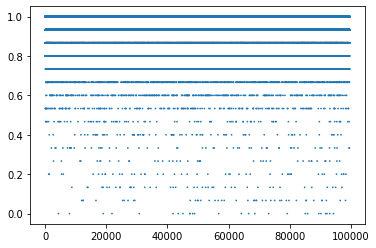

In [19]:
mean_error_list = []
for error in session_action_error_list:
    mean_error_list.append(mean(error))

s = [0.5 for i in range(len(mean_error_list))]
plt.scatter(np.arange(len(mean_error_list)), mean_error_list, s = s)
plt.show()

In [20]:
error_below_half_count = 0
error_above_half_count = 0
for error in mean_error_list:
    if error <= 0.5:
        error_below_half_count += 1
    else:
        error_above_half_count += 1

print("Session Count with error less than half: ", error_below_half_count)
print("Session Count with error more than half: ", error_above_half_count)

Session Count with error less than half:  395
Session Count with error more than half:  99265
